# Model Uncertainty MultiCP

**Multi-Head Conformal Prediction for Multispectral Image Classification**

---

This notebook is the **go-to evaluation script** for trained multi-head models.  
It performs end-to-end MultiCP evaluation, generates all report figures, and writes a complete Excel workbook.

| Step | What happens |
|------|-------------|
| **Load** | Reads `model_registry_multihead.json` and loads each saved `.keras` model |
| **Calibrate** | Runs RAPS / SAPS scoring over the calibration split |
| **Head sweep** | Records coverage & set size as heads are added (1 → K) |
| **Binary map** | Replaces the uncertainty heat map with a binary certain / uncertain mask |
| **Export** | Writes every figure + table into a per-model Excel sheet |

> **Do not modify** sections 4–5 (custom layers / architectures) unless retraining.  
> Only sections 2.1 and 2.2 typically need editing per experiment.

# 1.0 — Setup & Imports
Mount Google Drive (if running in Colab), then import all required libraries grouped by origin.

In [1]:
import os, sys, io, json, math, gc, random, subprocess
from pathlib import Path

from scipy.io import loadmat

# ── Google Colab: mount drive ──────────────────────────────────────────────
if 'google.colab' in sys.modules:
    from google.colab import drive
    drive.mount('/content/drive')

# ── Scientific / data ──────────────────────────────────────────────────────
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from scipy.spatial import Voronoi, voronoi_plot_2d
from sklearn.model_selection import train_test_split

# ── Excel export ───────────────────────────────────────────────────────────
from openpyxl import Workbook, load_workbook
from openpyxl.drawing.image import Image as XLImage
from openpyxl.utils.dataframe import dataframe_to_rows

# ── TensorFlow / Keras ─────────────────────────────────────────────────────
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K, layers, activations, optimizers
from tensorflow.keras.layers import (
    Input, Add, Multiply, Reshape, Dense, Activation, BatchNormalization,
    Flatten, Dropout, concatenate, Lambda,
    Conv2D, AveragePooling2D, MaxPooling2D, GlobalAveragePooling2D,
    GlobalAvgPool2D, DepthwiseConv2D, SeparableConv2D, MaxPool2D, UpSampling2D,
    Conv2DTranspose, add, multiply, LayerNormalization,
)
from tensorflow.python.util.tf_export import keras_export
from tensorflow.python.ops import array_ops
from tensorflow.python.keras.utils import control_flow_util
from tensorflow.keras.models import load_model, Model

sns.set(style='whitegrid', context='talk')
np.random.seed(42); random.seed(42); tf.random.set_seed(42)

Mounted at /content/drive


# 2.0 — Configuration

> ✏️ **Only edit this section between experiments.**  
> All paths, hyper-parameters, and colour settings live here.

## 2.1 — Paths
Point `PROJECT_ROOT` to whichever Drive folder holds `Data/`, `models/`, and `results/`.

In [2]:
PROJECT_ROOT_CANDIDATES = [
    Path('/content/drive/My Drive/Classification'),
    Path('/content/drive/My Drive/Classification'),
]
PROJECT_ROOT = next((p for p in PROJECT_ROOT_CANDIDATES if p.exists()),
                    PROJECT_ROOT_CANDIDATES[0])

DATA_DIR         = PROJECT_ROOT / 'data'
MODEL_DIR        = PROJECT_ROOT / 'multicp' / 'models'
OUTPUT_DIR       = PROJECT_ROOT / 'multicp' /'results'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

WORKBOOK_PATH       = OUTPUT_DIR / 'multicp_results.xlsx'
MODEL_REGISTRY_PATH = MODEL_DIR  / 'model_registry_multihead.json'
DATA_FILE           = DATA_DIR   / 'DIAS.mat'      # hyperspectral cube (H, W, Bands)
LABEL_FILE          = DATA_DIR   / 'DIAS_ref.mat'  # reference / ground-truth label map

print('Project root :', PROJECT_ROOT)
print('Workbook path:', WORKBOOK_PATH)

Project root : /content/drive/My Drive/Classification
Workbook path: /content/drive/My Drive/Classification/multicp/results/multicp_results.xlsx


## 2.2 — Hyper-parameters & Constants

| Group | Key variables |
|-------|--------------|
| Image geometry | `H`, `W`, `B`, `P_S` |
| CP settings | `ALPHA` (error rate), `SCORING_METHODS`, `UNCERTAIN_FRACTION` |
| Model | `K_HEADS`, `NUM_CLASSES` |
| Colours | `CLASS_COLORS`, `CERTAIN_COLOR`, `UNCERTAIN_MAP_COLOR` |

In [3]:
# ── Image / patch dimensions ───────────────────────────────────────────────
# H, W, B are inferred automatically from the .mat cube shape once loaded in
# Section 3.0, so this notebook works unchanged for any scene size / band count.
H, W, B  = None, None, None
P_S      = 9              # patch size
PERCENTILE_CLIP = (2.0, 98.0)  # robust per-band stretch range (2nd-98th percentile)

# ── Training / evaluation ──────────────────────────────────────────────────
BATCH_SIZE        = 128
TRAIN_PERCENT     = 0.75
ALPHA             = 0.05   # conformal prediction error rate
SCORING_METHODS   = ['RAPS', 'SAPS']
K_HEADS           = 7   # ensemble head count — architectural choice, unrelated to class count
# NUM_CLASSES is inferred automatically from the loaded label map in Section 3.0
NUM_CLASSES       = None
UNCERTAIN_FRACTION = 0.10  # top-fraction considered uncertain

# ── Colours ────────────────────────────────────────────────────────────────
# Same bold, saturated palette as the original 7-class scene, extended to a
# base of 10 (covers the new 8-class dataset) with additional bold shades
# (same style) generated on the fly if a future dataset needs more than 10.
import colorsys

CLASS_COLOR_BASE = [
    '#0000FF', '#00FF00', '#FF0000', '#00FFFF', '#FF00FF',
    '#FFFF00', '#A52A2A', '#FFA500', '#7FFF00', '#8A2BE2',
]
UNCERTAIN_COLOR       = '#808080'
CERTAIN_COLOR         = '#FFFF00'
UNCERTAIN_MAP_COLOR   = '#001F3F'
BINARY_UNCERTAINTY_CMAP = ListedColormap([CERTAIN_COLOR, UNCERTAIN_MAP_COLOR])

def _generate_extra_shades(n_extra, hue_offset=0.05, sat=0.85, val=0.95):
    """Bold, highly-saturated extra hues in the same style as CLASS_COLOR_BASE."""
    shades = []
    for i in range(n_extra):
        hue = (hue_offset + i / max(n_extra, 1)) % 1.0
        r, g, b = colorsys.hsv_to_rgb(hue, sat, val)
        shades.append('#%02x%02x%02x' % (int(r * 255), int(g * 255), int(b * 255)))
    return shades

def get_class_colors(n):
    """Return n distinct hex colours, extending the base 10 with additional
    bold shades in the same saturated style if needed."""
    if n <= len(CLASS_COLOR_BASE):
        return CLASS_COLOR_BASE[:n]
    return CLASS_COLOR_BASE + _generate_extra_shades(n - len(CLASS_COLOR_BASE))

def resolve_uncertain_color(class_colors, preferred=UNCERTAIN_COLOR, min_dist=60):
    """Return `preferred` unless it visually clashes with any class colour, in
    which case fall back to a distinct dark slate so 'Uncertain' never collides
    with a real class colour."""
    def _hex_to_rgb(h):
        h = h.lstrip('#')
        return tuple(int(h[i:i+2], 16) for i in (0, 2, 4))
    pr, pg, pb = _hex_to_rgb(preferred)
    for c in class_colors:
        cr, cg, cb = _hex_to_rgb(c)
        dist = ((pr - cr) ** 2 + (pg - cg) ** 2 + (pb - cb) ** 2) ** 0.5
        if dist < min_dist:
            return '#2F2F2F'
    return preferred

# CLASS_COLORS is finalised once NUM_CLASSES is known (Section 3.0)
CLASS_COLORS = None

MODEL_NAME_MAP = {
    'AlexNet_CNN_MultiHead': 'AlexNet CNN',
    'GFNet_MultiHead'      : 'GFNet',
    'ViT_UNet_MultiHead'   : 'ViT UNet',
}

## 2.3 — Clone & Import Multi-CP Repository
Clones `https://github.com/yamtawa/Multi-CP` once into the project root and adds it to `sys.path`.

In [4]:
repo_path = PROJECT_ROOT / 'Multi-CP'
if not repo_path.exists():
    subprocess.run(
        ['git', 'clone', 'https://github.com/yamtawa/Multi-CP.git', str(repo_path)],
        check=True,
    )
if str(repo_path) not in sys.path:
    sys.path.append(str(repo_path))

from utils import compute_scores
print('Multi-CP repo:', repo_path)

Multi-CP repo: /content/drive/My Drive/Classification/Multi-CP


# 3.0 — Data Loading & Preprocessing

Reads the hyperspectral/multispectral scene (`DIAS.mat`) and ground-truth labels (`DIAS_ref.mat`).

**Pipeline:**  
1. Load the `(H, W, Bands)` cube and `(H, W)` label map from .mat files  
2. Robust per-band percentile-clip stretch to `[0, 1]`  
3. Edge-pad the image by `(P_S−1)/2` pixels, then extract every labelled `P_S × P_S` patch  
4. Stratified split → **train 75 %** / **calibration 12.5 %** / **test 12.5 %**


In [5]:
# ── Load raw data ──────────────────────────────────────────────────────────
def _first_mat_array(mat_dict, key=None):
    """Return the named variable, or the first non-metadata array in the .mat file."""
    if key is not None:
        return mat_dict[key]
    candidates = [v for k, v in mat_dict.items() if not k.startswith('__')]
    if not candidates:
        raise ValueError(f'No data arrays found in {mat_dict.keys()}')
    return candidates[0]

data_mat  = loadmat(DATA_FILE)
label_mat = loadmat(LABEL_FILE)

x = _first_mat_array(data_mat).astype(np.float32)
y = _first_mat_array(label_mat).astype(np.int32)

if x.ndim != 3:
    raise ValueError(f'Expected a (H, W, Bands) cube, got shape {x.shape}')
if y.shape != x.shape[:2]:
    raise ValueError(f'Label shape {y.shape} does not match image shape {x.shape[:2]}')

H, W, B = x.shape
NUM_CLASSES = int(np.unique(y).size) - 1  # exclude background class 0
CLASS_COLORS = get_class_colors(NUM_CLASSES)

# ── Robust per-band stretch (percentile clip, not literal min/max) ──────────
# A handful of saturated/no-data pixels (e.g. sensor clipping at the int8
# range limits -128/127) would otherwise dominate the stretch and crush the
# dynamic range of the rest of the scene.
for b in range(B):
    band  = x[:, :, b]
    lo    = np.percentile(band, PERCENTILE_CLIP[0])
    hi    = np.percentile(band, PERCENTILE_CLIP[1])
    denom = max(hi - lo, 1e-8)
    x[:, :, b] = np.clip((band - lo) / denom, 0.0, 1.0)

print('Scene geometry: H=%d  W=%d  Bands=%d  Classes=%d' % (H, W, B, NUM_CLASSES))

# ── Extract labelled patches ───────────────────────────────────────────────
pad_width = (P_S - 1) // 2
padded_x  = np.pad(x, [(pad_width, pad_width), (pad_width, pad_width), (0, 0)], 'edge')

X, Y = [], []
for a in range(H):
    for b in range(W):
        if y[a][b] != 0:
            X.append(padded_x[a:a + P_S, b:b + P_S, :])
            Y.append(y[a][b] - 1)

X = np.array(X, dtype=np.float32)
Y = np.array(Y, dtype=np.int32)

# ── Train / calibration / test split ──────────────────────────────────────
x_train, x_test, y_train, y_test = train_test_split(
    X, Y, train_size=TRAIN_PERCENT, stratify=Y, random_state=10)
x_cal, x_test_new, y_cal, y_test_new = train_test_split(
    x_test, y_test, test_size=0.5, stratify=y_test, random_state=42)

print('x_cal:', x_cal.shape, '  x_test_new:', x_test_new.shape)

x_cal: (2155, 9, 9, 6)   x_test_new: (2155, 9, 9, 6)


# 4.0 — Custom Keras Layers

> ⚠️ **Do not edit these classes** unless you are retraining from scratch.  
> They are required by `load_model` via `CUSTOM_OBJECTS`.

## 4.1 — Pearson Correlation Masked Attention
Computes pixel-wise Pearson correlation with the centre pixel, masks sub-mean correlations, and uses the masked map as a spatial attention weight.

In [6]:
class Pearson_correlation_masked(layers.Layer):
    """Pixel-wise Pearson-correlation attention — masks pixels below mean correlation."""
    def __init__(self, P_S=9, **kwargs):
        super().__init__(**kwargs)
        self.P_S = P_S

    def call(self, inputs):
        loc      = self.P_S // 2
        channels = inputs.shape[-1]
        x_mean   = tf.repeat(tf.math.reduce_mean(inputs, axis=-1, keepdims=True), channels, axis=-1)
        y        = tf.repeat(tf.repeat(inputs[:, loc:loc+1, loc:loc+1, :], self.P_S, axis=-2), self.P_S, axis=-3)
        y_mean   = tf.repeat(tf.math.reduce_mean(y, axis=-1, keepdims=True), channels, axis=-1)
        a, b     = inputs - x_mean, y - y_mean
        num      = tf.reduce_sum(a * b,   axis=-1, keepdims=True)
        deno     = tf.sqrt(tf.reduce_sum(a*a, axis=-1, keepdims=True) *
                           tf.reduce_sum(b*b, axis=-1, keepdims=True))
        corr     = num / deno
        mask     = tf.cast(corr > tf.reduce_mean(corr), corr.dtype)
        attention_weights = tf.repeat(mask * corr, channels, axis=-1)
        return multiply([inputs, attention_weights])

    def get_config(self):
        cfg = super().get_config(); cfg.update({"P_S": self.P_S}); return cfg

## 4.2 — Structured Dropout (`Dropout_Train`)
A deterministic "shift" dropout used during the progressive training schedule.  
Each training shift zeros out a different contiguous slice of neurons, forcing the network to learn distributed representations.

In [7]:
@keras_export('keras.layers.Dropout')
class Dropout_Train(layers.Layer):
    """Deterministic structured dropout used during training shift scheduling."""
    def __init__(self, rate, shift=1, noise_shape=None, seed=None, **kwargs):
        super().__init__(**kwargs)
        if not 0 <= rate <= 1:
            raise ValueError(f"Invalid rate {rate}")
        if type(shift) != int:
            raise TypeError(f"shift must be int, got {type(shift)}")
        if shift * rate > 1.0:
            raise ValueError(f"shift {shift} too large for rate {rate}")
        self.rate, self.shift = rate, shift
        self.noise_shape, self.seed = noise_shape, seed
        self.supports_masking = True

    def _get_noise_shape(self, inputs):
        if self.noise_shape is None:
            return None
        concrete = array_ops.shape(inputs)
        return tf.convert_to_tensor(
            [concrete[i] if v is None else v for i, v in enumerate(self.noise_shape)])

    def call(self, inputs, training=None):
        if self.rate == 0:
            return tf.identity(inputs)
        if training is None:
            training = K.learning_phase()

        def dropped_inputs():
            sz      = inputs.shape[-1]
            r0      = int(self.rate * (self.shift - 1) * sz)
            r1      = int(self.rate * self.shift * sz) if self.shift * self.rate < 1.0 else None
            mult    = np.ones(sz); mult[r0:r1] = 0.0
            return Multiply()([inputs, tf.constant(mult)])

        return control_flow_util.smart_cond(
            training, dropped_inputs, lambda: array_ops.identity(inputs))

    def compute_output_shape(self, input_shape): return input_shape

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"rate": self.rate, "shift": self.shift,
                    "noise_shape": self.noise_shape, "seed": self.seed,
                    "supports_masking": self.supports_masking})
        return cfg

## 4.3 — Model Modifier & Progressive Training Callback
`modified_model` swaps every named dropout layer with a `Dropout_Train` instance for the current shift.  
`Custom_callbacks` drives the full shift schedule: it advances the shift when `val_accuracy` exceeds the target for `min_epochs` consecutive epochs and saves the best weights at the end.

In [8]:
def modified_model(model, layer_name, rate, new_layer, shift, **kwargs):
    """Swap every layer whose name contains *layer_name* with a fresh *new_layer* instance."""
    name = kwargs.get("name")
    x    = model.layers[0].output
    modified, z = False, 0
    for lyr in model.layers[1:]:
        if layer_name in lyr.name.upper():
            kw = {"name": f"{layer_name}_{shift}_{z}"}
            x  = (new_layer(rate=rate, shift=shift, **kw)(x)
                  if type(shift) != str
                  else new_layer(rate=rate, **kw)(x))
            modified = True; z += 1
        else:
            x = lyr(x)
    if not modified:
        print("Model has not been modified")
    return Model(inputs=model.layers[0].input, outputs=x, name=name)


class Custom_callbacks(tf.keras.callbacks.Callback):
    """Progressive-shift training callback: advances dropout shift when target accuracy is met."""
    def __init__(self, filepath, epochs, rate, new_layer=Dropout_Train,
                 layer_name="DROPOUT", accuracy_score=0.99, min_epochs=50):
        super().__init__()
        self.filepath, self.epochs          = filepath, epochs
        self.new_layer, self.rate           = new_layer, rate
        self.best, self.epoch_num           = 0.0, 1
        self.layer_name, self.min_epochs    = layer_name, min_epochs
        self.accuracy_score = accuracy_score if accuracy_score <= 1.0 else accuracy_score / 100.0

    def on_train_begin(self, logs=None):
        self.shift = 1; self.epoch_completed = 0
        print(f"Training in {int(1/self.rate)} shifts")
        self.model = modified_model(self.model, self.layer_name, self.rate, self.new_layer, self.shift)

    def on_train_end(self, logs=None):
        if self.shift <= int(1 / self.rate):
            raise NotImplementedError(f"Only {self.shift-1}/{int(1/self.rate)} shifts completed")
        self.model.set_weights(self.best_weights)
        self.model.save(self.filepath)

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_completed += 1; self.epoch_num += 1
        n_shifts = int(1 / self.rate)
        if logs["val_accuracy"] >= self.accuracy_score and self.epoch_completed >= self.min_epochs:
            if self.shift < n_shifts:
                self.shift += 1
                self.model = modified_model(self.model, self.layer_name, self.rate,
                                            self.new_layer, self.shift)
                self.epoch_completed = 0
            elif self.shift == n_shifts:
                self.model = modified_model(self.model, self.layer_name, self.rate,
                                            self.new_layer, "Final", name="AlexNet")
                self.shift += 1; self.epoch_completed = 0
        else:
            if self.shift >= n_shifts:
                current = logs.get("val_accuracy")
                if not np.less(current, self.best) and self.epoch_num >= self.epochs - 10:
                    self.best = current
                    self.best_weights = self.model.get_weights()

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"filepath": self.filepath, "epochs": self.epochs,
                    "rate": self.rate, "layer_name": self.layer_name,
                    "min_epochs": self.min_epochs, "accuracy_score": self.accuracy_score})
        return cfg

# 5.0 — Model Architectures

> ⚠️ **Do not edit** — these definitions must exactly match the saved checkpoints.

## 5.1 — AlexNet (Multi-Head)
Five Conv2D layers → MaxPool → three Dense+Dropout blocks → `K_HEADS` parallel softmax heads.

In [9]:
def AlexNet(input_shape, num_classes=13, use_pearson_corr=False, dropout_rate=0.5):
    """AlexNet-style CNN with K_HEADS parallel softmax output heads."""
    x_input = Input(input_shape)
    X = Pearson_correlation_masked(P_S)(x_input) if use_pearson_corr else x_input

    # ── Convolutional backbone ─────────────────────────────────────────────
    for filters in [96, 256, 384, 384, 256]:
        X = Conv2D(filters, (3,3), activation='relu', padding='same')(X)
    X = MaxPooling2D((2,2), strides=(2,2), padding='same')(X)

    # ── Dense head ────────────────────────────────────────────────────────
    X = Flatten()(X)
    for units, tag in [(4096,'1'), (1024,'2'), (256,'3')]:
        X = Dense(units, activation='relu')(X)
        X = Dropout(dropout_rate, name=f"TRAIN_DROPOUT_{tag}")(X)
    X = Dense(32, activation='relu')(X)

    # ── K parallel output heads ───────────────────────────────────────────
    outputs = [Dense(num_classes, activation='softmax', dtype='float32',
                     name=f'head_{i+1}')(X) for i in range(K_HEADS)]
    return Model(inputs=x_input, outputs=outputs, name="MultiHead_AlexNet")

## 5.2 — GFNet (Multi-Head)
Global-Filter Network: patch extraction → positional encoding → `N` GF-Blocks (FFT-based global filter + GELU MLP) → GAP → `K_HEADS` softmax heads.

In [10]:
# ── GFNet sub-layers ──────────────────────────────────────────────────────

class GF_MLP(layers.Layer):
    """Two-layer GELU MLP used inside GF_Block."""
    def __init__(self, in_features, out_features, drop=0.0, **kwargs):
        super().__init__(**kwargs)
        self.in_features, self.out_features, self.drop = in_features, out_features, drop
        self.mlp_1 = Dense(in_features,  activation=activations.gelu, use_bias=False)
        self.mlp_2 = Dense(out_features, activation=activations.gelu, use_bias=False)
        self.drop_1 = Dropout(drop); self.drop_2 = Dropout(drop)

    def call(self, x):
        return self.drop_2(self.mlp_2(self.drop_1(self.mlp_1(x))))

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"in_features": self.in_features, "out_features": self.out_features, "drop": self.drop})
        return cfg


class GF_DropPath(layers.Layer):
    """Stochastic depth / drop-path regularisation."""
    def __init__(self, drop_prob=0.0, training=False, **kwargs):
        super().__init__(**kwargs)
        self.drop_prob, self.training = drop_prob, training

    def call(self, x, **kwargs):
        if self.drop_prob == 0. or not self.training:
            return x
        keep_prob     = 1 - self.drop_prob
        shape         = (x.shape[0],) + (1,) * (x.ndim - 1)
        random_tensor = keep_prob + tf.random.uniform(shape, dtype=x.dtype)
        random_tensor.floor_()
        return tf.divide(x, keep_prob) * random_tensor

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"drop_prob": self.drop_prob, "training": self.training})
        return cfg


class GF_Expand_Dims(layers.Layer):
    """Wraps tf.expand_dims as a Keras layer."""
    def __init__(self, ndim, **kwargs):
        super().__init__(**kwargs); self.ndim = ndim

    def call(self, x): return tf.expand_dims(x, axis=self.ndim)

    def get_config(self):
        cfg = super().get_config(); cfg.update({"ndim": self.ndim}); return cfg


class GF_Patches(layers.Layer):
    """Extract image patches — either via extract_patches or Conv2D projection."""
    def __init__(self, patch_size=3, hidden_dim=256, patch_method='extract', **kwargs):
        super().__init__(**kwargs)
        self.patch_size, self.hidden_dim = patch_size, hidden_dim
        self.patch_method = patch_method.lower()

    def call(self, images):
        if self.patch_method == "conv":
            x = Conv2D(self.hidden_dim, self.patch_size, self.patch_size)(images)
            return Reshape([-1, x.shape[-1]])(x)
        batch_size = tf.shape(images)[0]
        patches    = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1], padding="VALID")
        return tf.reshape(patches, [batch_size, -1, patches.shape[-1]])

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"patch_size": self.patch_size, "hidden_dim": self.hidden_dim,
                    "patch_method": self.patch_method})
        return cfg


class GF_PatchEncoder(layers.Layer):
    """Linear projection + positional embedding for GFNet patches."""
    def __init__(self, num_patches, projection_dim, **kwargs):
        super().__init__(**kwargs)
        self.num_patches, self.projection_dim = num_patches, projection_dim
        self.projection        = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(num_patches, projection_dim)

    def call(self, patch, **kwargs):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        return self.projection(patch) + self.position_embedding(positions)

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"num_patches": self.num_patches, "projection_dim": self.projection_dim})
        return cfg


class GF_GlobalFilter(layers.Layer):
    """Learnable frequency-domain filter via 2-D real FFT."""
    def __init__(self, patch_size, dim, **kwargs):
        super().__init__(**kwargs); self.patch_size, self.dim = patch_size, dim

    def build(self, input_shape):
        self.complex_weight = self.add_weight(
            name="complex_weight",
            shape=(self.patch_size, self.patch_size, input_shape[-1] // 2 + 1, 2),
            initializer=tf.random_uniform_initializer(), trainable=True)
        super().build(input_shape)

    def call(self, x, **kwargs):
        B, N, C = x.shape
        a = b = int(math.sqrt(N))
        x = tf.reshape(x, [-1, a, b, C])
        x = tf.signal.rfft2d(x)
        x = x * tf.dtypes.complex(self.complex_weight[:,:,:,0], self.complex_weight[:,:,:,-1])
        x = tf.signal.irfft2d(x)
        return tf.reshape(x, [-1, N, C])

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"patch_size": self.patch_size, "dim": self.dim}); return cfg


class GF_Block(tf.keras.layers.Layer):
    """Single GFNet transformer-style residual block."""
    def __init__(self, patch_size=3, dim=512, mlp_ratio=4.0, drop=0.0, drop_path=0.0, **kwargs):
        super().__init__(**kwargs)
        self.patch_size, self.dim        = patch_size, dim
        self.mlp_ratio, self.drop        = mlp_ratio, drop
        self.drop_path_rate              = drop_path
        self.norm1  = tf.keras.layers.LayerNormalization(axis=-1)
        self.filter = GF_GlobalFilter(patch_size, dim)
        self.drop_path = GF_DropPath(drop_path)
        self.norm2  = tf.keras.layers.LayerNormalization(axis=-1)
        self.mlp    = GF_MLP(int(dim * mlp_ratio), dim, drop)

    def call(self, x):
        return x + self.drop_path(self.mlp(self.norm2(self.filter(self.norm1(x)))))

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"patch_size": self.patch_size, "dim": self.dim,
                    "mlp_ratio": self.mlp_ratio, "drop": self.drop,
                    "drop_path": self.drop_path_rate})
        return cfg


def GFNet(input_shape=(P_S, P_S, B), use_pearson_corr=False, patch_size=3,
          num_classes=16, hidden_dim=512, GlobalFilter_layers=12, mlp_ratio=4,
          num_patches=9, dropout_rate=0.0, drop_path_rate=0.0):
    """GFNet with K_HEADS parallel softmax output heads."""
    x_input = Input(shape=input_shape)
    x = Pearson_correlation_masked(P_S)(x_input) if use_pearson_corr else x_input
    x = GF_Patches(patch_size)(x)
    x = GF_PatchEncoder(num_patches, hidden_dim)(x)
    x = Dropout(dropout_rate, name="TRAIN_DROPOUT_1")(x)
    for _ in range(GlobalFilter_layers):
        x = GF_Block(patch_size, hidden_dim, mlp_ratio, dropout_rate, drop_path_rate)(x)
    x = Dropout(dropout_rate, name="TRAIN_DROPOUT_2")(x)
    x = LayerNormalization()(x)
    x = GF_Expand_Dims(ndim=2)(x)
    x = GlobalAveragePooling2D()(x)
    x = Flatten()(x)
    x = Dropout(dropout_rate, name="TRAIN_DROPOUT_3")(x)
    outputs = [Dense(num_classes, activation="softmax", dtype="float32",
                     name=f"head_{i+1}")(x) for i in range(K_HEADS)]
    return keras.Model(inputs=x_input, outputs=outputs, name="MultiHead_GFNet")

## 5.3 — Vision Transformer (Multi-Head)
ViT with learned-weight residuals and optional U-Net-style symmetric skip connections.  
Supports three representation strategies: `with_gap` (default), `with_cls_tkn`, `without_gap`.

In [11]:
# ── ViT sub-layers ────────────────────────────────────────────────────────

class ViT_SpatialAttention(layers.Layer):
    """Lightweight 4-conv spatial attention branch."""
    def __init__(self, k_size=3, **kwargs):
        super().__init__(**kwargs); self.k_size = k_size
        self.norm    = layers.BatchNormalization()
        self.conv1   = layers.Conv2D(1, k_size, padding="same")
        self.conv2   = layers.Conv2D(1, k_size, padding="same")
        self.conv3   = layers.Conv2D(1, k_size, padding="same")
        self.conv4   = layers.Conv2D(1, k_size, padding="same")
        self.relu    = layers.Activation("relu")
        self.sigmoid = layers.Activation("sigmoid")

    def call(self, inputs):
        x = self.relu(self.conv2(self.norm(self.conv1(inputs))))
        x = self.relu(self.conv3(x))
        return self.sigmoid(self.conv4(x))

    def get_config(self):
        cfg = super().get_config(); cfg.update({"k_size": self.k_size}); return cfg


class ViT_SpatialAttention1(layers.Layer):
    """Encoder-decoder spatial attention with strided Conv + ConvTranspose."""
    def __init__(self, input_shape, **kwargs):
        super().__init__(**kwargs)
        self.input_shape_val = input_shape
        self.filters = input_shape[-1]
        self.k_size  = input_shape[1]
        self.norm    = layers.BatchNormalization()
        self.conv1   = layers.Conv2D(self.filters, 3, padding="same", kernel_initializer="he_normal")
        self.conv2   = layers.Conv2D(self.filters, 3, strides=2, padding="same")
        self.conv3   = layers.Conv2D(self.filters, 3, strides=2, padding="same")
        self.convt1  = layers.Conv2DTranspose(self.filters, 3, strides=2, padding="same")
        self.convt2  = layers.Conv2DTranspose(self.filters, 3, strides=2, padding="same")
        self.relu    = layers.ReLU()
        self.sigmoid = layers.Activation("sigmoid")

    def call(self, inputs):
        x = self.relu(self.norm(self.conv1(inputs)))
        x = self.relu(self.conv2(x))
        x = self.relu(self.conv3(x))
        x = self.relu(self.convt1(x))
        x = self.relu(self.convt2(x))
        if x.shape[1] != self.input_shape_val[1] or x.shape[2] != self.input_shape_val[2]:
            k = x.shape[1] - self.k_size + 1
            x = layers.Conv2D(self.filters, k, strides=1, padding="valid")(x)
        return self.sigmoid(x)

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"input_shape": self.input_shape_val}); return cfg


def MLP(x, hidden_units, dropout_rate):
    """Feedforward MLP used inside ViT Transformer blocks."""
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.keras.activations.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x


class ViT_Patches(layers.Layer):
    """Extract non-overlapping patches and project to embed_dim."""
    def __init__(self, patch_size, embed_dim=768, **kwargs):
        super().__init__(**kwargs)
        self.patch_size, self.embed_dim = patch_size, embed_dim

    def build(self, input_shape):
        self.projection = layers.Dense(self.embed_dim)

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches    = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1], padding="VALID")
        patches = tf.reshape(patches, [batch_size, -1, patches.shape[-1]])
        return self.projection(patches)

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"patch_size": self.patch_size, "embed_dim": self.embed_dim}); return cfg


class ViT_PatchEncoder(layers.Layer):
    """Linear projection + CLS token + positional embedding."""
    def __init__(self, num_patches, projection_dim, **kwargs):
        super().__init__(**kwargs)
        self.num_patches, self.projection_dim = num_patches, projection_dim
        self.projection       = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(num_patches + 1, projection_dim)
        self.cls_token = self.add_weight(
            name="cls_token", shape=(1,1,projection_dim),
            initializer=tf.zeros_initializer(), trainable=True)

    def call(self, patch, **kwargs):
        batch_size = tf.shape(patch)[0]
        cls_tokens = tf.repeat(self.cls_token, batch_size, axis=0)
        x          = tf.concat([cls_tokens, self.projection(patch)], axis=1)
        positions  = tf.range(start=0, limit=self.num_patches + 1, delta=1)
        return x + self.position_embedding(positions)

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"num_patches": self.num_patches, "projection_dim": self.projection_dim})
        return cfg


class ViT_Weighted_add(layers.Layer):
    """Learnable weighted residual: out = w*a + (1-w)*b."""
    def __init__(self, name, **kwargs):
        super().__init__(**kwargs); self.wt_name = name

    def build(self, input_shape):
        self.w = self.add_weight(
            name=f"weighted_add_{self.wt_name}", shape=(1,),
            initializer=tf.random_normal_initializer(), trainable=True)

    def call(self, a, b): return a * self.w + b * (1.0 - self.w)

    def get_config(self):
        cfg = super().get_config(); cfg.update({"wt_name": self.wt_name}); return cfg


class ViT_TransFormer(layers.Layer):
    """Single Transformer encoder block with learned-weight residuals."""
    def __init__(self, layer_num, num_heads, projection_dim, dropout=0.1, **kwargs):
        super().__init__(**kwargs)
        self.layer_num, self.num_heads = layer_num, num_heads
        self.projection_dim, self.dropout = projection_dim, dropout

    def build(self, input_shape):
        self.norm1 = layers.LayerNormalization(epsilon=1e-6, name=f"ln1_{self.layer_num}")
        self.norm2 = layers.LayerNormalization(epsilon=1e-6, name=f"ln2_{self.layer_num}")
        self.add1  = ViT_Weighted_add(f"transformer_1_{self.layer_num}")
        self.add2  = ViT_Weighted_add(f"transformer_2_{self.layer_num}")
        self.mha   = layers.MultiHeadAttention(
            num_heads=self.num_heads, key_dim=self.projection_dim,
            dropout=self.dropout, name=f"mha_{self.layer_num}")
        self.dense1 = layers.Dense(self.projection_dim * 2, activation=tf.keras.activations.gelu)
        self.dense2 = layers.Dense(self.projection_dim,     activation=tf.keras.activations.gelu)
        self.drop1  = layers.Dropout(self.dropout)
        self.drop2  = layers.Dropout(self.dropout)

    def call(self, inputs, training=None):
        x1 = self.add1(self.mha(self.norm1(inputs), self.norm1(inputs), training=training), inputs)
        x2 = self.drop1(self.dense1(self.norm2(x1)), training=training)
        x2 = self.drop2(self.dense2(x2), training=training)
        return self.add2(x2, x1)

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"layer_num": self.layer_num, "num_heads": self.num_heads,
                    "projection_dim": self.projection_dim, "dropout": self.dropout})
        return cfg


class ViT_TransFormer_Block(layers.Layer):
    """Stack of ViT_TransFormer layers with U-Net-style symmetric skip connections."""
    def __init__(self, num_layers, num_heads, projection_dim, dropout=0.1, **kwargs):
        super().__init__(**kwargs)
        self.num_layers, self.num_heads = num_layers, num_heads
        self.projection_dim, self.dropout = projection_dim, dropout

    def build(self, input_shape):
        self.Blocks = [ViT_TransFormer(i, self.num_heads, self.projection_dim, self.dropout)
                       for i in range(self.num_layers)]

    def call(self, inputs, training=None):
        stack, x = [], inputs
        for i, blk in enumerate(self.Blocks):
            x = blk(x, training=training)
            if i <= self.num_layers // 2:
                stack.append(x)
            else:
                x = layers.Add()([x, stack[self.num_layers - i - 1]])
        return x

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"num_layers": self.num_layers, "num_heads": self.num_heads,
                    "projection_dim": self.projection_dim, "dropout": self.dropout})
        return cfg


class ViT_Class_Token_Norm(layers.Layer):
    """Layer-normalise full sequence then return CLS token (index 0)."""
    def __init__(self, eps=1e-6, **kwargs):
        super().__init__(**kwargs); self.eps = eps
        self.norm = layers.LayerNormalization(epsilon=eps)

    def call(self, inputs): return self.norm(inputs)[:, 0, :]

    def get_config(self):
        cfg = super().get_config(); cfg.update({"eps": self.eps}); return cfg


# ── ViT hyper-parameters (module-level, used by factory) ──────────────────
patch_size         = 3
num_patches        = 9
projection_dim     = 256
num_heads          = 4
transformer_layers = 12
dropout            = 0.1


def create_vit_classifier(input_shape=(P_S, P_S, B), num_classes=7,
                           use_pearson_corr=False, dropout_rate=0.25,
                           method="with_gap", k_heads: int = 1):
    """
    Vision Transformer classifier.

    Parameters
    ----------
    k_heads : int
        Number of parallel softmax output heads.
        k_heads==1 returns a single tensor; k_heads>1 returns a list.
    method : str
        One of 'with_cls_tkn', 'without_gap', 'with_gap'.
    """
    inputs = layers.Input(shape=input_shape)
    x0     = Pearson_correlation_masked(P_S)(inputs) if use_pearson_corr else inputs

    patches        = ViT_Patches(patch_size, embed_dim=projection_dim)(x0)
    encoded        = ViT_PatchEncoder(num_patches, projection_dim)(patches)
    encoded        = ViT_TransFormer_Block(transformer_layers, num_heads,
                                           projection_dim, dropout)(encoded)
    encoded        = layers.Dropout(dropout_rate, name="TRAIN_DROPOUT_1")(encoded)

    if method == "with_cls_tkn":
        rep = ViT_Class_Token_Norm()(encoded)
    elif method == "without_gap":
        rep = layers.Flatten()(layers.LayerNormalization(epsilon=1e-6)(encoded))
    elif method == "with_gap":
        rep = tf.reduce_mean(layers.LayerNormalization(epsilon=1e-6)(encoded), axis=1)
    else:
        raise ValueError(f"Unknown method: {method}")

    x = layers.Dense(512, activation=tf.keras.activations.gelu)(rep)
    x = layers.Dropout(dropout_rate, name="TRAIN_DROPOUT_3")(x)
    x = layers.Dense(256, activation=tf.keras.activations.gelu)(x)
    x = layers.Dense(128, activation=tf.keras.activations.gelu)(x)
    x = layers.Dropout(dropout_rate, name="TRAIN_DROPOUT_5")(x)
    x = layers.Dense(64,  activation=tf.keras.activations.gelu)(x)
    features = layers.Dropout(dropout_rate, name="TRAIN_DROPOUT_6")(x)

    heads = [layers.Dense(num_classes, activation="softmax", dtype="float32",
                           name=f"head_{i+1}")(features) for i in range(max(1, k_heads))]
    outputs = heads[0] if k_heads == 1 else heads
    return keras.Model(inputs=inputs, outputs=outputs)

## 5.4 — Custom Objects Registry
Dictionary passed to `load_model(..., custom_objects=CUSTOM_OBJECTS)` so Keras can  
deserialise every bespoke layer defined above without errors.

In [12]:
CUSTOM_OBJECTS = {
    'Pearson_correlation_masked' : Pearson_correlation_masked,
    'Dropout_Train'              : Dropout_Train,
    'GF_Patches'                 : GF_Patches,
    'GF_PatchEncoder'            : GF_PatchEncoder,
    'GF_GlobalFilter'            : GF_GlobalFilter,
    'GF_Block'                   : GF_Block,
    'GF_Expand_Dims'             : GF_Expand_Dims,
    'GF_MLP'                     : GF_MLP,
    'GF_DropPath'                : GF_DropPath,
    'ViT_Patches'                : ViT_Patches,
    'ViT_PatchEncoder'           : ViT_PatchEncoder,
    'ViT_SpatialAttention'       : ViT_SpatialAttention,
    'ViT_SpatialAttention1'      : ViT_SpatialAttention1,
    'ViT_Weighted_add'           : ViT_Weighted_add,
    'ViT_TransFormer'            : ViT_TransFormer,
    'ViT_TransFormer_Block'      : ViT_TransFormer_Block,
    'ViT_Class_Token_Norm'       : ViT_Class_Token_Norm,
}

# 6.0 — Utility Functions

## 6.1 — Excel / Workbook & Figure Helpers
Small, reusable helpers for workbook management (`ensure_workbook`, `autosize_columns`, `write_df`),  
figure serialisation (`fig_to_buffer`, `add_image`), and bar-chart annotation (`add_bar_labels`).

In [13]:
def ensure_workbook(path):
    """Load workbook if it exists, otherwise create a fresh one with a Summary sheet."""
    if path.exists():
        return load_workbook(path)
    wb = Workbook(); ws = wb.active; ws.title = 'Summary'
    wb.save(path); return wb

def autosize_columns(ws):
    """Set column widths based on maximum cell-value length (capped at 40)."""
    for col in ws.columns:
        vals = [len(str(c.value)) for c in col if c.value is not None]
        if vals:
            ws.column_dimensions[col[0].column_letter].width = min(max(vals) + 2, 40)

def fig_to_buffer(fig):
    """Render a matplotlib figure to an in-memory PNG buffer."""
    buf = io.BytesIO()
    fig.savefig(buf, format='png', dpi=220, bbox_inches='tight', facecolor='white')
    buf.seek(0); return buf

def add_image(ws, fig, anchor):
    """Embed a matplotlib figure into an openpyxl worksheet at *anchor* (e.g. 'N2')."""
    img = XLImage(fig_to_buffer(fig)); img.anchor = anchor; ws.add_image(img)

def write_df(ws, df, start_row=1, start_col=1):
    """Write a DataFrame (with header) into a worksheet starting at the given cell."""
    for r, row in enumerate(dataframe_to_rows(df, index=False, header=True), start=start_row):
        for c, val in enumerate(row, start=start_col):
            ws.cell(row=r, column=c, value=val)

def add_bar_labels(ax, fmt='{:.2f}', y_pad=0.01):
    """Annotate each bar in a bar chart with its height value."""
    ymax = max(ax.get_ylim()[1], 1e-9)
    for p in ax.patches:
        h = p.get_height()
        if np.isnan(h): continue
        ax.text(p.get_x() + p.get_width() / 2, h + y_pad * ymax,
                fmt.format(h), ha='center', va='bottom', fontsize=9)

# 7.0 — MultiCP Evaluation Functions

Core conformal prediction logic.  

| Function | Role |
|----------|------|
| `get_multihead_outputs` | Batch-predict → stacked `(K, N, C)` array |
| `get_image_multi_head_outputs` | Same but for every pixel in the full scene |
| `generate_Dcal_Dcells_sets` | Split calibration set into Dcells + D_re_cal |
| `main_algo` | Compute quantile thresholds → prediction sets → coverage |
| `compute_head_sweep` | Run `main_algo` for heads 1…K, return sweep DataFrame |
| `per_class_coverage_df` | Marginal coverage per class |
| `build_binary_uncertainty_outputs` | Full-scene binary uncertainty map + pixel counts |

In [14]:
def get_multihead_outputs(model, x_data, batch_size=128):
    """Return stacked multi-head softmax outputs, shape (K, N, C)."""
    outputs = model.predict(x_data, batch_size=batch_size, verbose=0)
    if not isinstance(outputs, list):
        outputs = [outputs]
    return np.stack(outputs, axis=0)


def get_image_multi_head_outputs(model, padded_x, H, W, B, P_S, batch_size=32):
    """Extract every pixel patch from padded_x and return multi-head predictions (K, H*W, C)."""
    N       = H * W
    patches = np.zeros((N, P_S, P_S, B), dtype=padded_x.dtype)
    idx     = 0
    for i in range(H):
        for j in range(W):
            patches[idx] = padded_x[i:i + P_S, j:j + P_S, :]
            idx += 1
    return np.stack(model.predict(patches, batch_size=batch_size, verbose=0), axis=0)


def generate_Dcal_Dcells_sets(cal_scores, cal_target, fraction=0.05, seed=42):
    """Split calibration scores into Dcells (cell-selection set) and D_re_cal."""
    K, N, _   = cal_scores.shape
    rng       = np.random.default_rng(seed)
    n_cells   = max(1, int(N * fraction))
    idx_cells = rng.choice(N, n_cells, replace=False)

    Dcells_scores = cal_scores[:, idx_cells, cal_target[idx_cells].astype(int)].T
    Dcells_target = cal_target[idx_cells]

    mask            = np.ones(N, dtype=bool); mask[idx_cells] = False
    Dre_cal_scores  = cal_scores[:, mask, :]
    Dre_cal_target  = cal_target[mask]
    return Dcells_scores, Dcells_target, Dre_cal_scores, Dre_cal_target


def main_algo(Dcells_scores, Dcells_target, Dre_cal_scores, Dre_cal_target,
              test_scores, test_target, alpha, config):
    """Core MultiCP conformal inference: compute quantile thresholds and prediction sets."""
    K, N_cal = Dre_cal_scores.shape[0], Dre_cal_scores.shape[1]
    cal_true = Dre_cal_scores[np.arange(K)[:, None], np.arange(N_cal), Dre_cal_target]
    q        = np.quantile(cal_true, 1 - alpha, axis=1)
    pred_sets = test_scores <= q[:, None, None]
    valid    = (test_target >= 0) & (test_target < pred_sets.shape[2])
    covered  = np.all(pred_sets[np.arange(K)[:, None],
                                np.arange(np.sum(valid)),
                                test_target[valid]], axis=0)
    return covered.mean(), pred_sets.sum(axis=2).mean(), pred_sets


def compute_head_sweep(cal_output, test_output, cal_target, test_target, scoring_method):
    """Sweep number of heads from 1 to K and record coverage + set size at each step."""
    config      = {'ALPHA': ALPHA, 'SCORING_METHOD': scoring_method}
    cal_scores  = np.round(compute_scores(cal_output,  config), 4)
    test_scores = np.round(compute_scores(test_output, config), 4)
    rows, last_bundle = [], None
    for nH in range(1, cal_output.shape[0] + 1):
        Dc, Dt, Rc, Rt = generate_Dcal_Dcells_sets(cal_scores[:nH], cal_target)
        cov, msz, pred_sets = main_algo(Dc, Dt, Rc, Rt, test_scores[:nH],
                                        test_target, ALPHA, config)
        rows.append({'heads': nH, 'coverage': float(cov), 'set_size': float(msz)})
        if nH == cal_output.shape[0]:
            last_bundle = (config, Dc, Dt, Rc, Rt, pred_sets)
    return pd.DataFrame(rows), last_bundle


def per_class_coverage_df(pred_sets, y_true):
    """Compute per-class marginal coverage from multi-head prediction sets."""
    joint_sets = pred_sets.all(axis=0)
    set_list   = [set(np.where(r)[0]) for r in joint_sets]
    rows = []
    for c in range(NUM_CLASSES):
        idx      = np.where(y_true == c)[0]
        coverage = float(np.mean([c in set_list[j] for j in idx])) if idx.size > 0 else np.nan
        rows.append({'Class': f'Class {c}', 'Coverage': coverage})
    return pd.DataFrame(rows)


def build_binary_uncertainty_outputs(model, padded_x, y_raw, config, Dc, Dt, Rc, Rt):
    """
    Run full-image conformal prediction and produce a binary uncertainty map.

    Pixels in the top UNCERTAIN_FRACTION by set size are marked uncertain.
    Ground-truth class-7 pixels (unlabelled) are also marked uncertain.
    """
    image_outputs = get_image_multi_head_outputs(model, padded_x, H, W, B, P_S, BATCH_SIZE)
    image_scores  = np.round(compute_scores(image_outputs, config), 4)

    y_flat       = y_raw.ravel()
    orig_mask    = np.zeros((H, W), dtype=bool); orig_mask[:330, :307] = True
    orig_mask_flat = orig_mask.ravel()
    gt_uncertain   = (y_flat == 7) & orig_mask_flat
    cp_valid       = orig_mask_flat & (~gt_uncertain)

    img_valid  = image_scores[:, cp_valid, :]
    y_valid    = y_flat[cp_valid] - 1
    cov, mset, pred_bool = main_algo(Dc, Dt, Rc, Rt, img_valid, y_valid, config['ALPHA'], config)
    set_sizes  = pred_bool.sum(axis=2).mean(axis=0)
    u_valid    = set_sizes / float(NUM_CLASSES)

    # Quantile threshold (top UNCERTAIN_FRACTION = uncertain)
    thresh              = np.nanquantile(u_valid, 1 - UNCERTAIN_FRACTION)
    cp_uncertain_valid  = u_valid >= thresh

    cp_uncertain = np.zeros(H * W, dtype=bool)
    cp_uncertain[np.where(cp_valid)[0][cp_uncertain_valid]] = True
    final_uncertain = cp_uncertain | gt_uncertain

    avg_probs  = np.mean(image_outputs, axis=0)
    class_pred = np.argmax(avg_probs, axis=1)
    class_map  = np.full(H * W, np.nan)
    class_map[orig_mask_flat] = class_pred[orig_mask_flat]

    display_map = class_map.copy(); display_map[final_uncertain] = np.nan
    binary_map  = np.zeros(H * W, dtype=np.int32)
    binary_map[orig_mask_flat] = 0
    binary_map[final_uncertain] = 1

    vis     = np.where(np.isnan(display_map.reshape(H, W)), -1, display_map.reshape(H, W))
    disp_r  = vis[orig_mask]
    counts  = [int(np.sum(disp_r == c)) for c in range(NUM_CLASSES)]
    counts += [int(np.sum(binary_map.reshape(H, W)[orig_mask] == 1))]

    return {
        'coverage'            : float(cov),
        'mean_set_size'       : float(mset),
        'binary_uncertainty_map': binary_map.reshape(H, W),
        'display_map'         : vis,
        'class_pixel_counts'  : counts,
    }

# 8.0 — Visualisation Functions

One function per figure type.  Each returns the `fig` object for embedding in Excel.

| Function | Figure |
|----------|--------|
| `head_sweep_figure` | Coverage & set size vs. number of heads |
| `per_class_figure` | Per-class marginal coverage bar chart |
| `binary_uncertainty_figure` | Binary certain / uncertain map |
| `prediction_map_figure` | Colour-coded class prediction map |
| `pixel_count_figure` | Pixel count per class including uncertain region |
| `visualize_cell_selection` | Voronoi diagram coloured by calibration-cell selection order |

In [15]:
def head_sweep_figure(df, model_name, scoring_method):
    """Line plots of coverage and set size vs. number of heads."""
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    sns.lineplot(data=df, x='heads', y='coverage',  marker='o', ax=axes[0], color='#4C72B0')
    axes[0].axhline(1 - ALPHA, linestyle='--', color='red', linewidth=2)
    axes[0].set_title(f'{model_name} {scoring_method}: Coverage')
    sns.lineplot(data=df, x='heads', y='set_size', marker='o', ax=axes[1], color='#55A868')
    axes[1].set_title(f'{model_name} {scoring_method}: Set Size')
    plt.tight_layout(); plt.show(); return fig


def per_class_figure(df, model_name, scoring_method):
    """Bar chart of per-class marginal coverage with desired-coverage reference line."""
    fig, ax = plt.subplots(figsize=(15, 7))
    ax.bar(df['Class'], df['Coverage'], color='skyblue', edgecolor='black')
    ax.axhline(1 - ALPHA, color='red', linestyle='--', linewidth=2,
                label=f'Desired Coverage ({1-ALPHA:.2f})')
    ax.set_title(f'Per-Class Coverage ({scoring_method}) - {model_name}', fontsize=16)
    ax.set_xlabel('Class'); ax.set_ylabel('Coverage'); ax.set_ylim([0, 1.1])
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.tick_params(axis='x', rotation=45)
    add_bar_labels(ax); ax.legend(loc='upper right')
    plt.tight_layout(); plt.show(); return fig


def binary_uncertainty_figure(binary_map, model_name):
    """Binary image: yellow = certain, dark-navy = uncertain."""
    cmap = ListedColormap([CERTAIN_COLOR, UNCERTAIN_MAP_COLOR])
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.imshow(binary_map.astype(int), cmap=cmap, vmin=0, vmax=1)
    ax.set_title(f'Predictions with {int((1-ALPHA)*100)}% Uncertainty Map\n'
                 f'(MultiCP — {model_name})', fontsize=16)
    ax.axis('off')
    ax.legend(handles=[Patch(facecolor=CERTAIN_COLOR,     edgecolor='black', label='Certain'),
                        Patch(facecolor=UNCERTAIN_MAP_COLOR, edgecolor='black', label='Uncertain')],
              loc='upper left', bbox_to_anchor=(1.02, 1), borderaxespad=0.0)
    plt.tight_layout(); plt.show(); return fig


def prediction_map_figure(display_map, model_name):
    """Colour-coded class prediction map (uncertain pixels shown in grey)."""
    combined = np.where(display_map == -1, NUM_CLASSES, display_map).astype(int)
    cmap     = ListedColormap(CLASS_COLORS + [resolve_uncertain_color(CLASS_COLORS)])
    fig, ax  = plt.subplots(figsize=(12, 10))
    im = ax.imshow(combined, cmap=cmap, vmin=0, vmax=NUM_CLASSES)
    ax.set_title(f'Predictions with {int((1-ALPHA)*100)}% Uncertainty Mask\n'
                 f'(MultiCP — {model_name})', fontsize=16)
    ax.axis('off')
    cbar = fig.colorbar(im, ax=ax, ticks=np.arange(NUM_CLASSES+1), fraction=0.046, pad=0.04)
    cbar.set_ticklabels([f'Class {i}' for i in range(NUM_CLASSES)] + ['Uncertain'])
    plt.tight_layout(); plt.show(); return fig


def pixel_count_figure(class_pixel_counts, model_name):
    """Bar chart of pixel counts per class (including uncertain region)."""
    labels = [f'Class {i}' for i in range(NUM_CLASSES)] + ['Uncertain']
    colors = CLASS_COLORS + [resolve_uncertain_color(CLASS_COLORS)]
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.bar(labels, class_pixel_counts, color=colors, edgecolor='black')
    ax.tick_params(axis='x', rotation=45); ax.set_ylabel('Number of Pixels')
    ax.set_title(f'Pixel Count per Class — {model_name}', fontsize=16)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    ymax = max(class_pixel_counts) if class_pixel_counts else 1
    for i, v in enumerate(class_pixel_counts):
        ax.text(i, v + 0.01 * ymax, f'{int(v):,}', ha='center', va='bottom', fontsize=9)
    plt.tight_layout(); plt.show(); return fig


def visualize_cell_selection(Dcells_scores, Dcells_target, D_i_order, model_name):
    """Voronoi diagram coloured by cell-selection order to visualise calibration coverage."""
    pts  = Dcells_scores[:, :2] if Dcells_scores.shape[1] > 2 else Dcells_scores
    vor  = Voronoi(pts)
    ranks            = np.argsort(D_i_order)
    normalized_order = np.zeros(len(pts))
    normalized_order[ranks] = np.linspace(0, 1, len(pts))

    fig, ax = plt.subplots(figsize=(7, 6))
    voronoi_plot_2d(vor, ax=ax, show_vertices=False, show_points=True,
                    line_colors='black', line_width=0.3)
    for ridx, region in enumerate(vor.point_region):
        poly = vor.regions[region]
        if -1 not in poly and len(poly) > 0:
            ax.fill(*zip(*[vor.vertices[i] for i in poly]),
                    color=cm.magma(1 - normalized_order[ridx]), alpha=0.9)
    sc = ax.scatter(pts[:,0], pts[:,1], c=normalized_order, cmap='magma_r',
                    edgecolor='white', s=40)
    plt.colorbar(sc, ax=ax, label='Selection Order (Dark=Earlier)')
    ax.set_title(f'Voronoi Cell Selection — {model_name}')
    plt.tight_layout(); plt.show()

    df = pd.DataFrame({'Cell Index': np.arange(len(pts)), 's1': pts[:,0], 's2': pts[:,1],
                       'Selection_Order': D_i_order, 'Norm_Order(0-1)': normalized_order,
                       'Target': Dcells_target})
    return fig, df

# 9.0 — Main Execution

**▶ Run this cell to produce all results.**

For every `(model, scoring_method)` pair the pipeline:
1. Loads the saved model
2. Computes multi-head outputs on calibration and test splits
3. Runs the head sweep and full-scene binary uncertainty mapping
4. Generates all 6 figures
5. Writes a dedicated Excel sheet + updates the Summary sheet
6. Saves `multicp_results.xlsx`


========================= Loading AlexNet CNN =========================


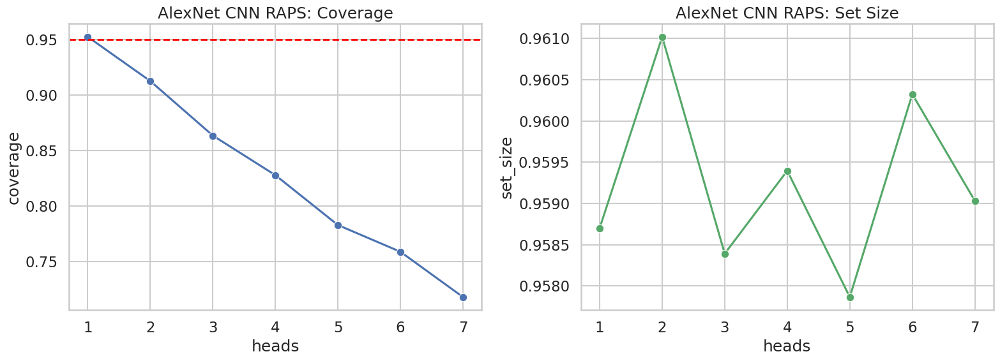

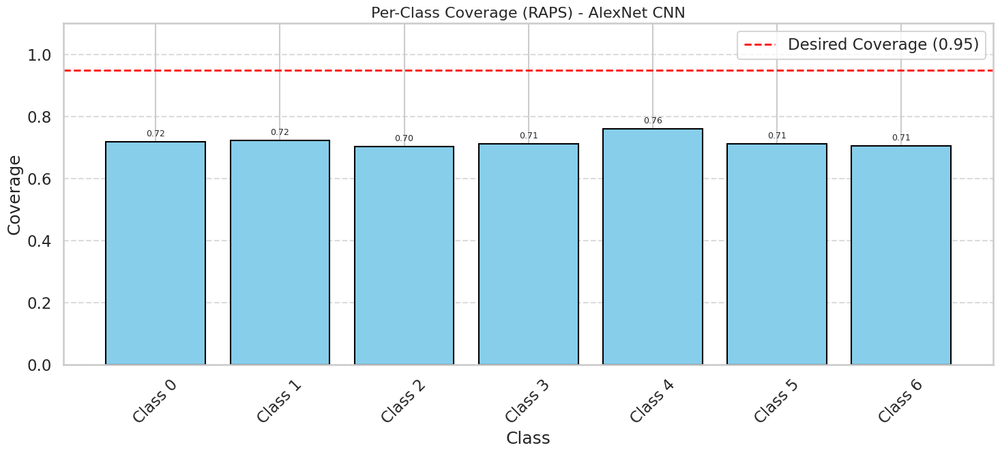

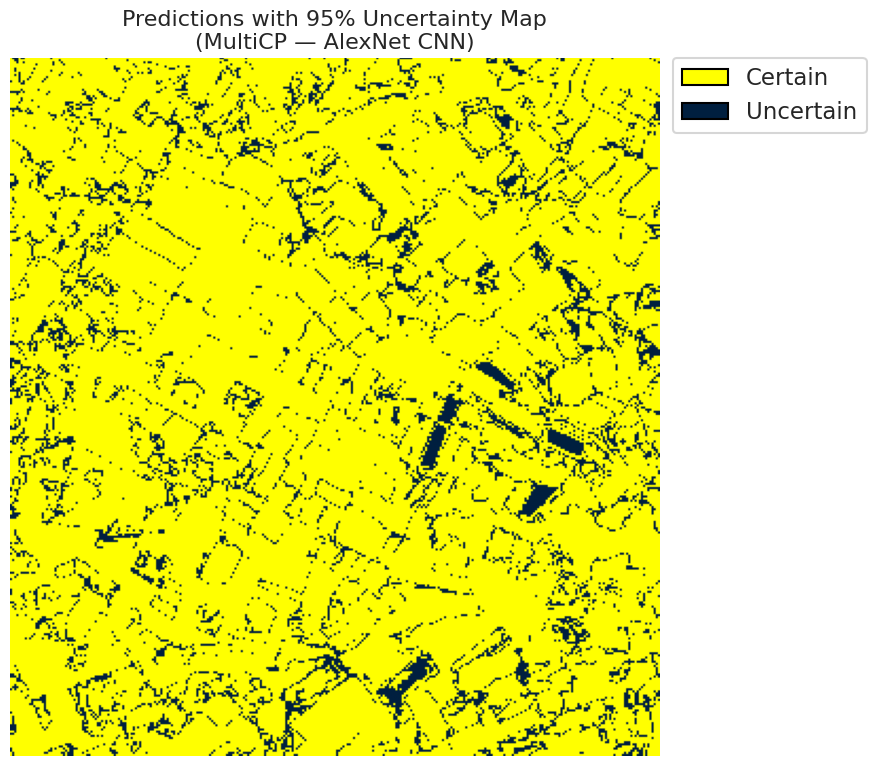

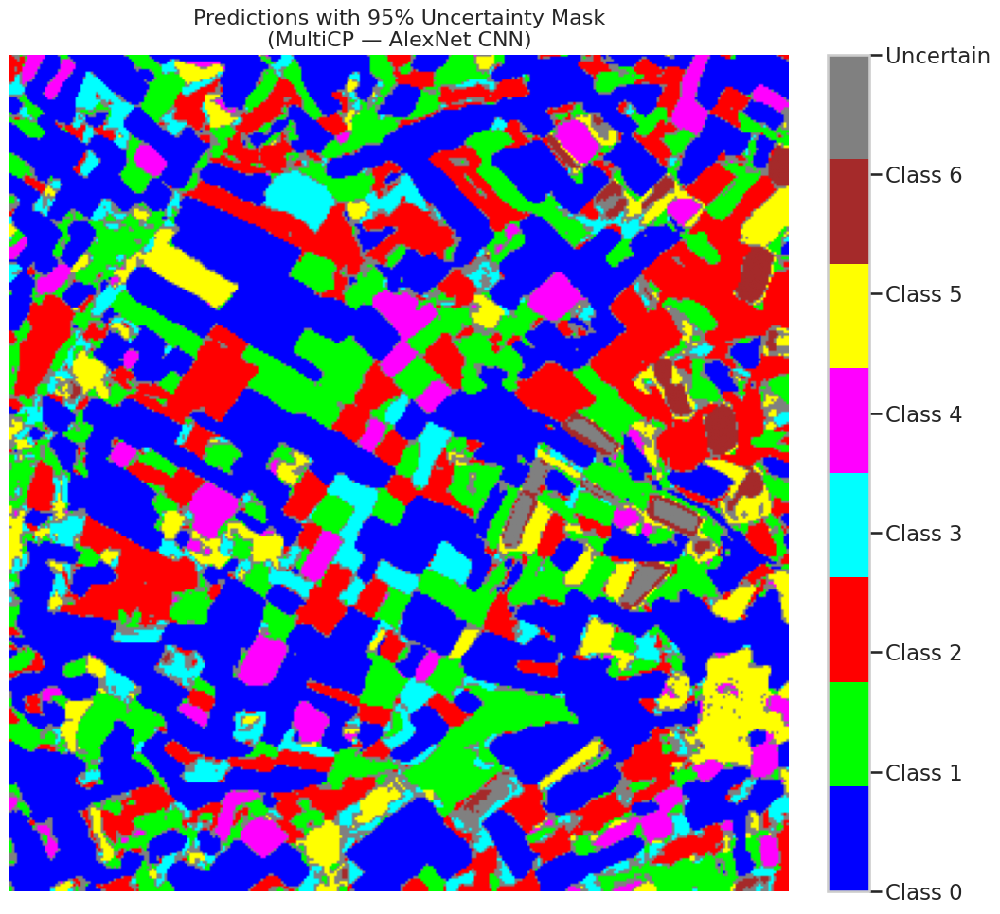

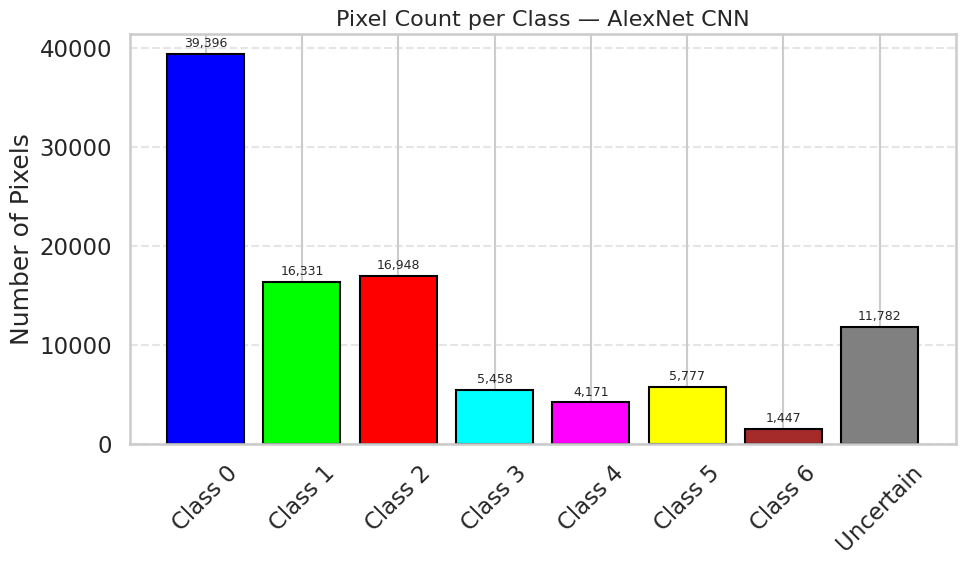

...

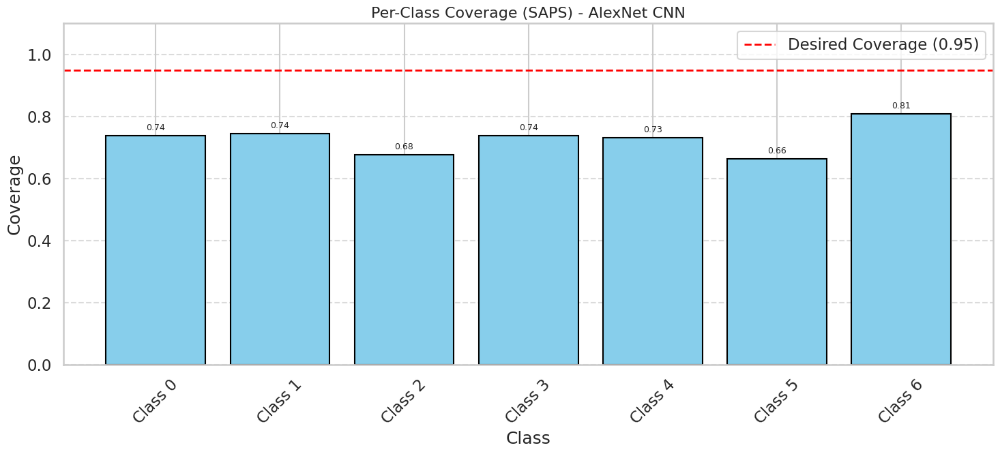

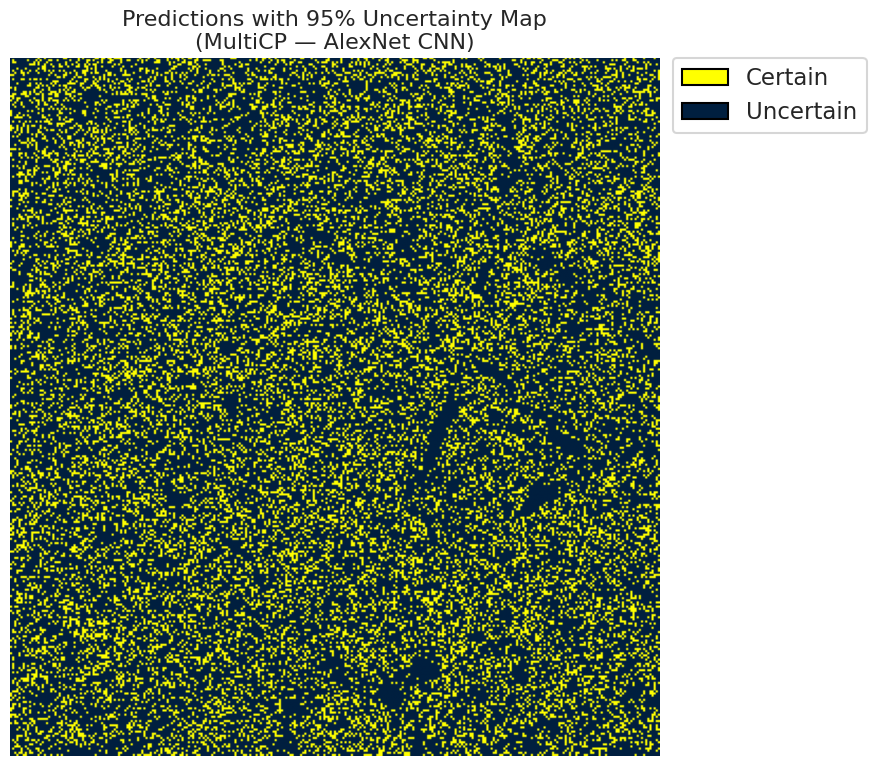

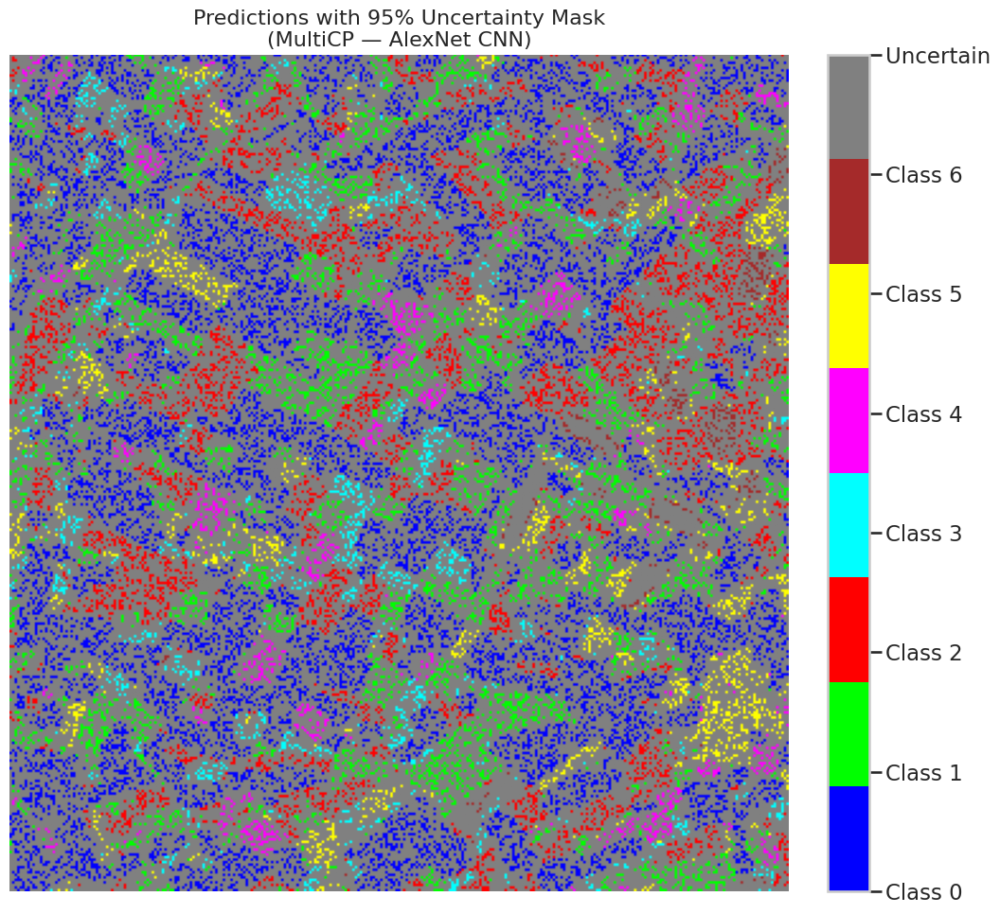

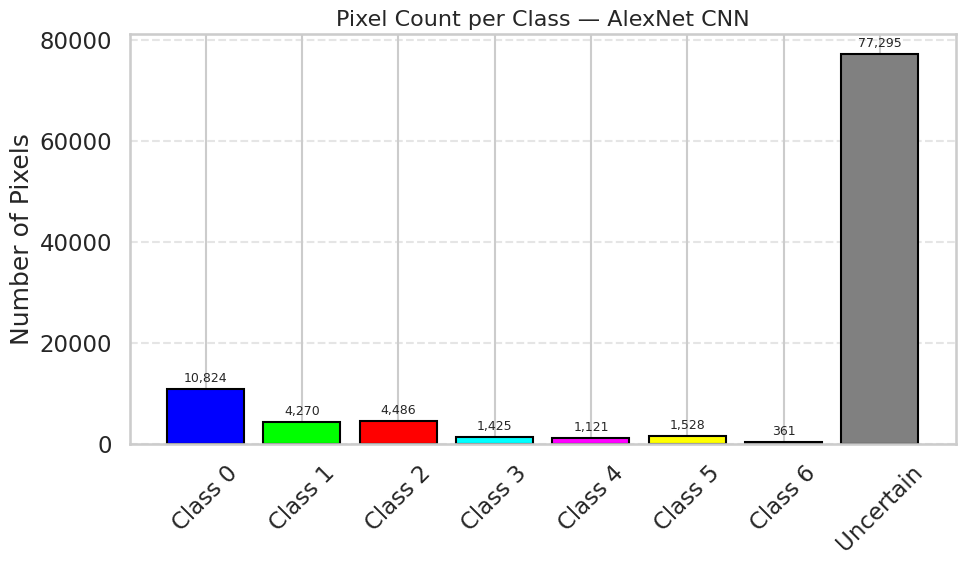

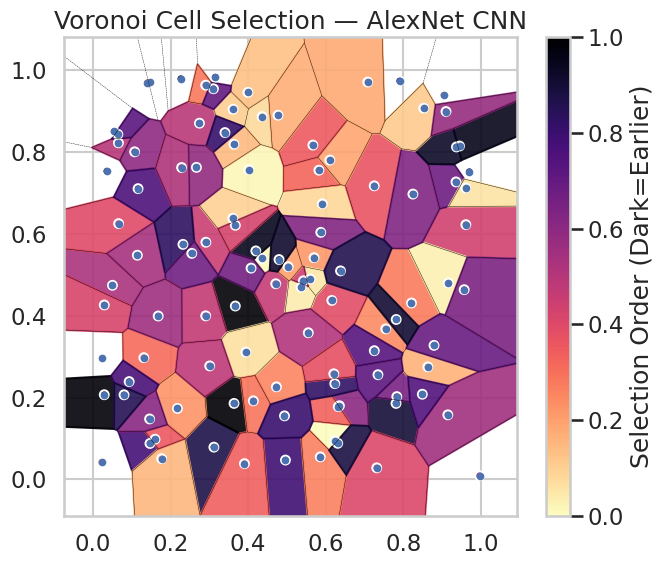


========================= Loading GFNet =========================


/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:424: UserWarning: `build()` was called on layer 'gf__patch_encoder', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:424: UserWarning: `build()` was called on layer 'gf__block', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:424: UserWarning: `build()` was called on layer 'gf__block_1', however the layer does 

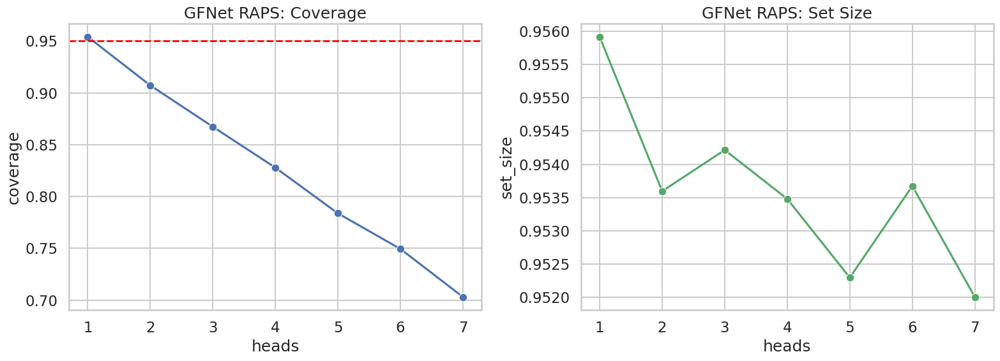

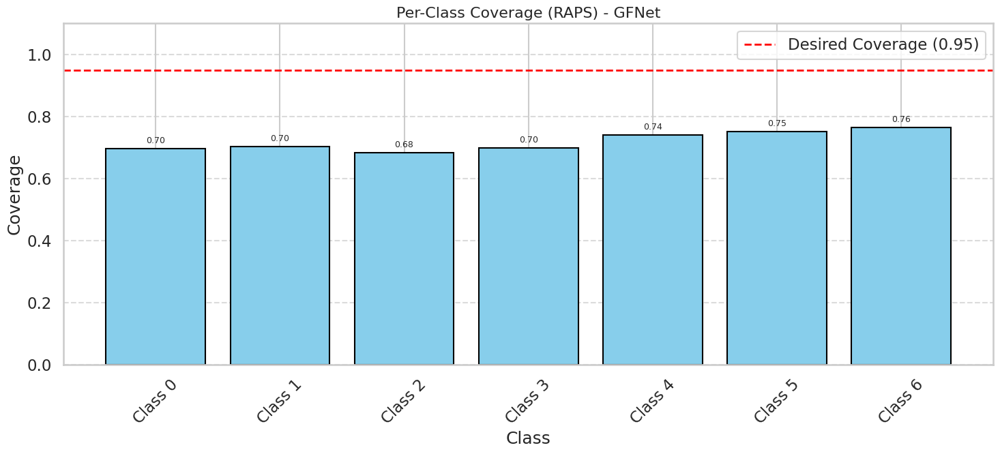

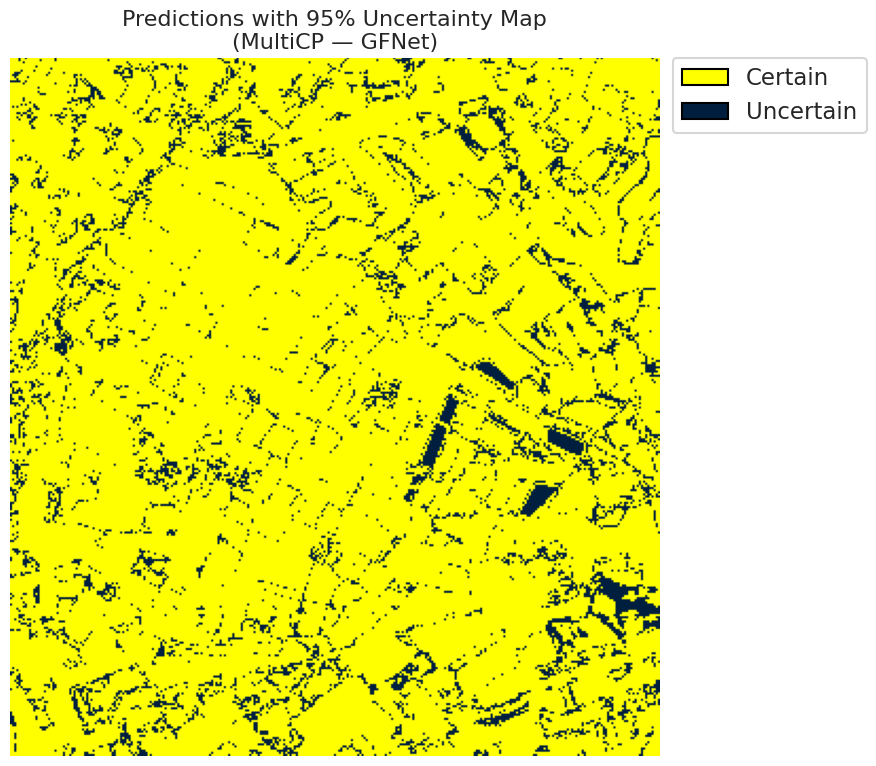

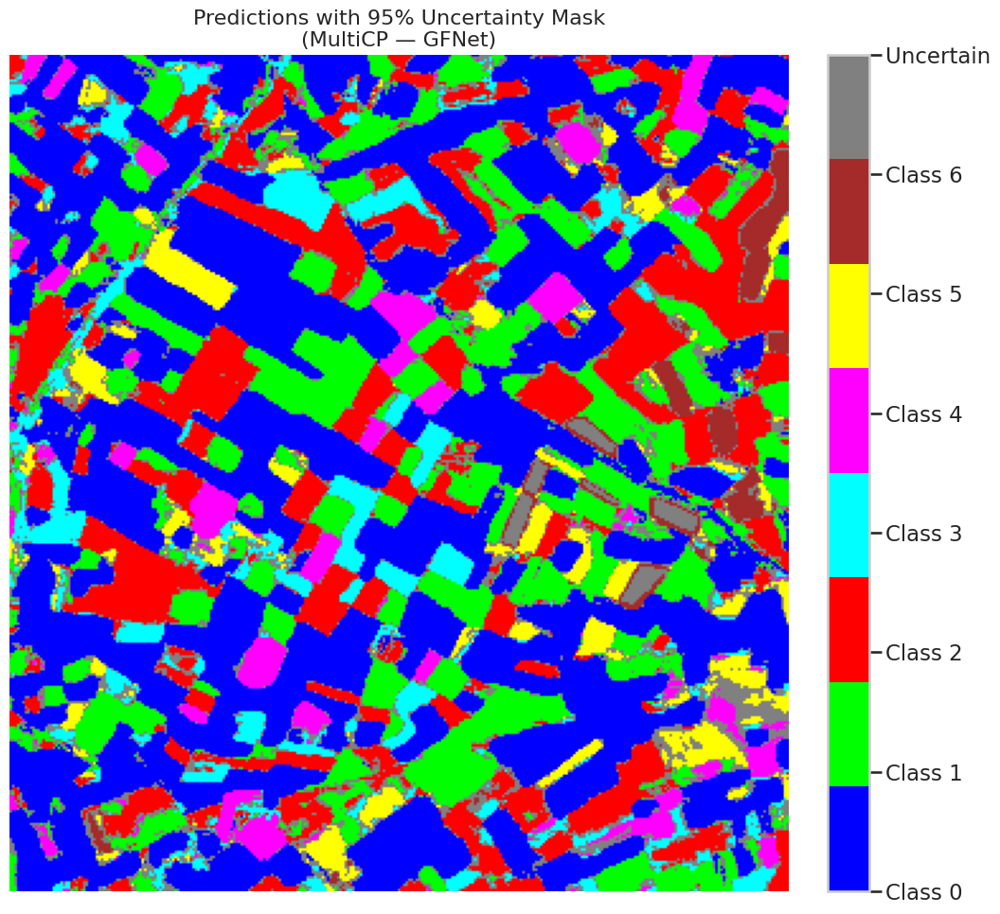

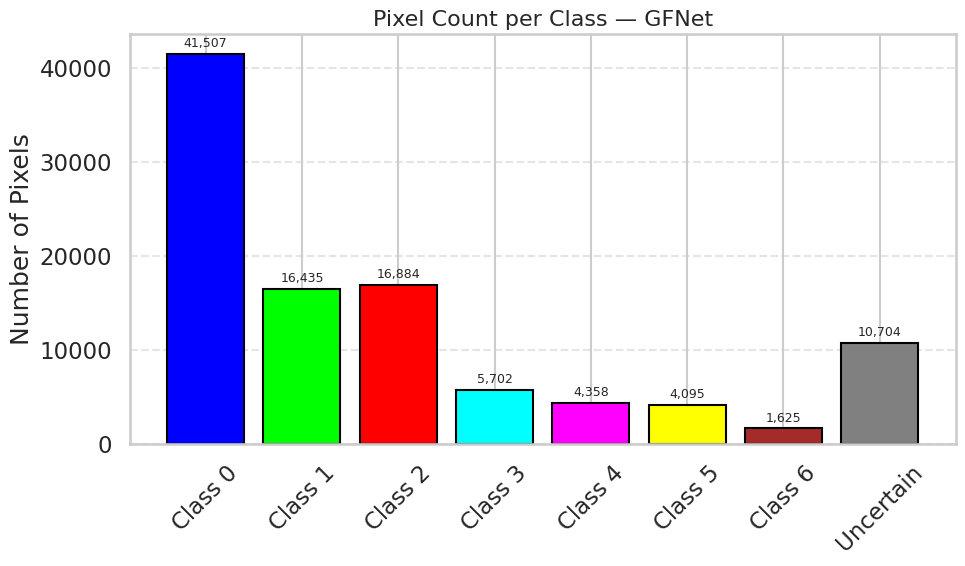

...

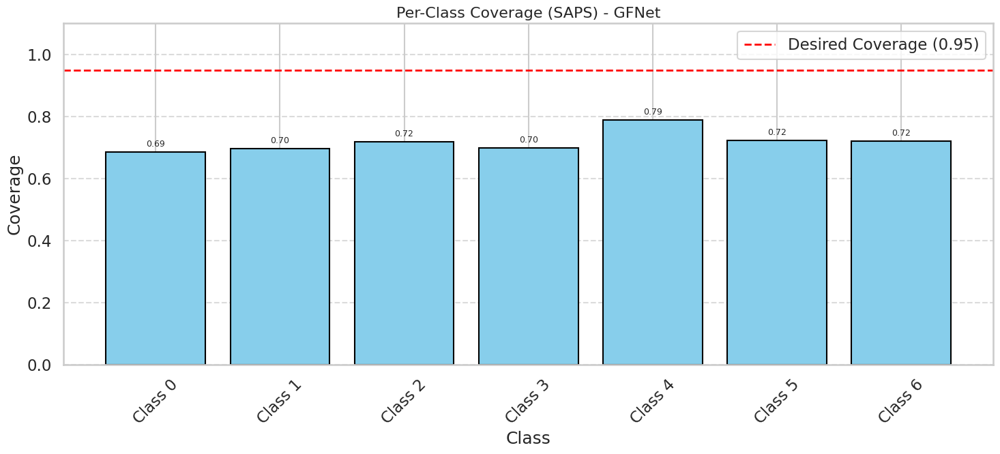

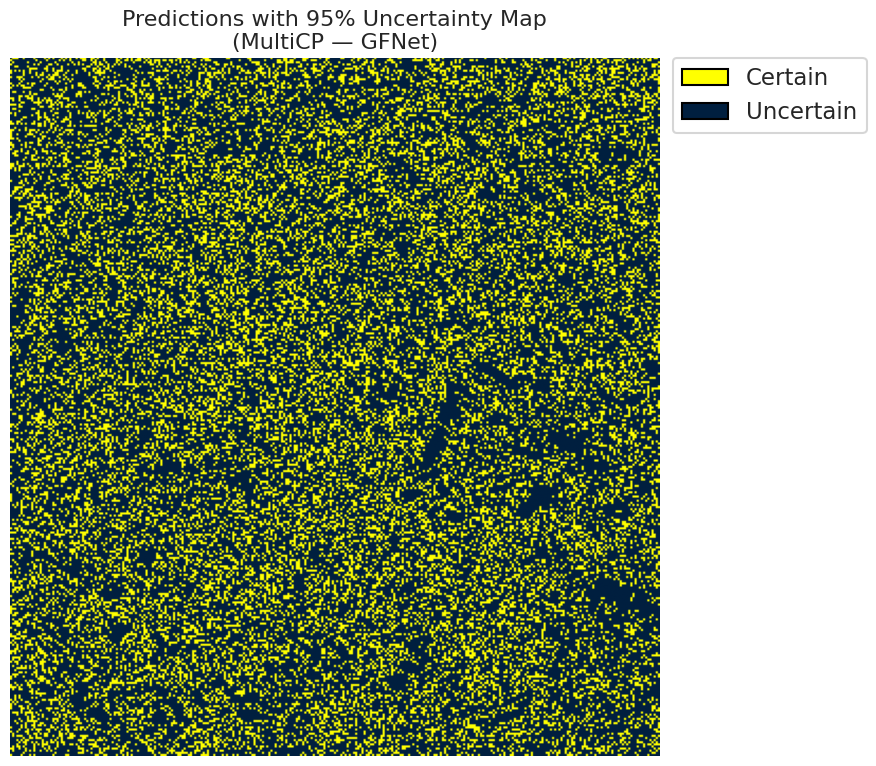

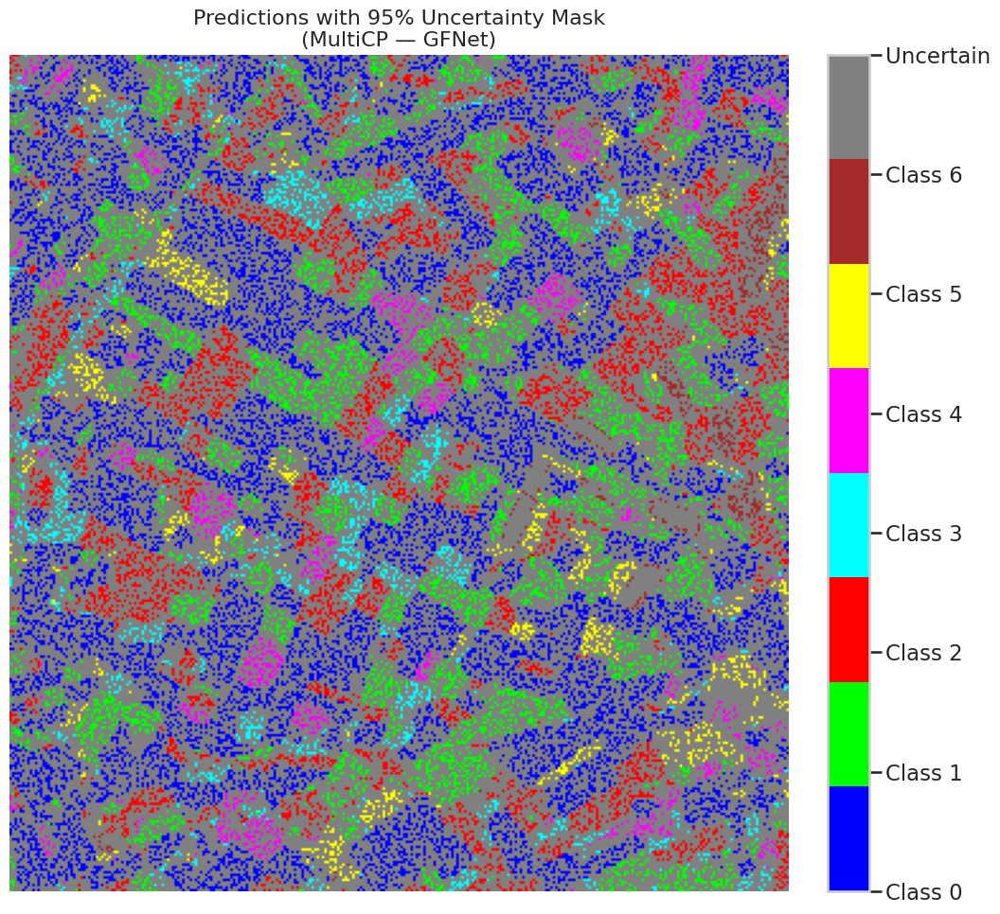

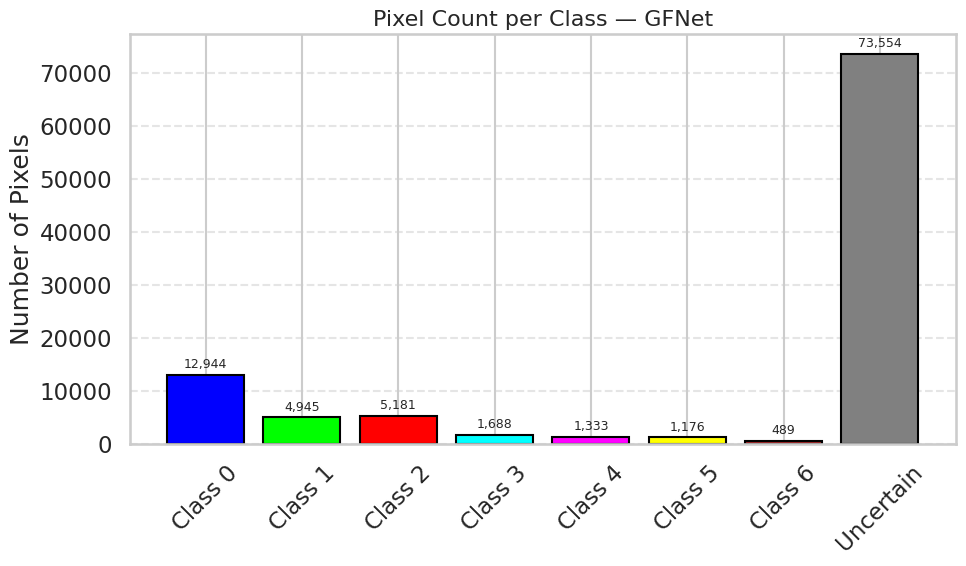

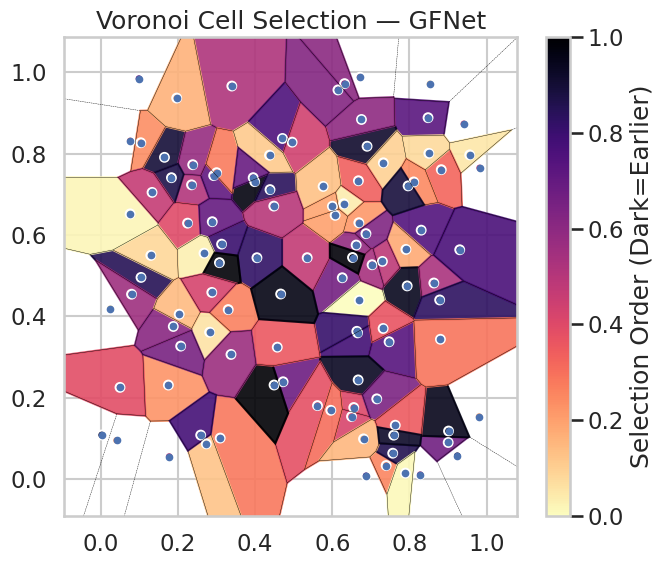


========================= Loading ViT UNet =========================


/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:424: UserWarning: `build()` was called on layer 'vi_t__patch_encoder', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:424: UserWarning: `build()` was called on layer 'vi_t__class__token__norm', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


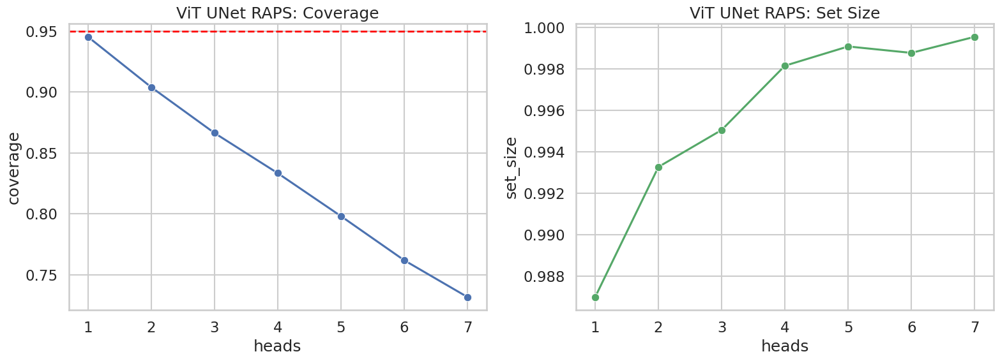

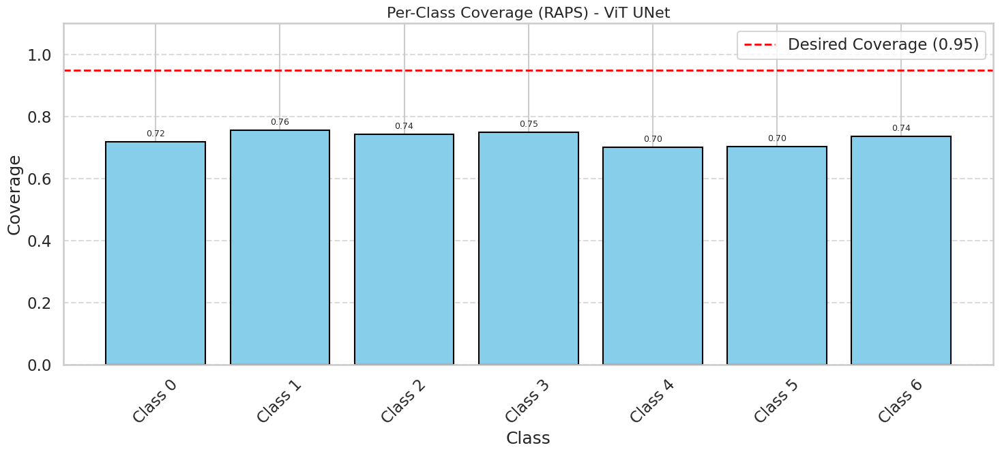

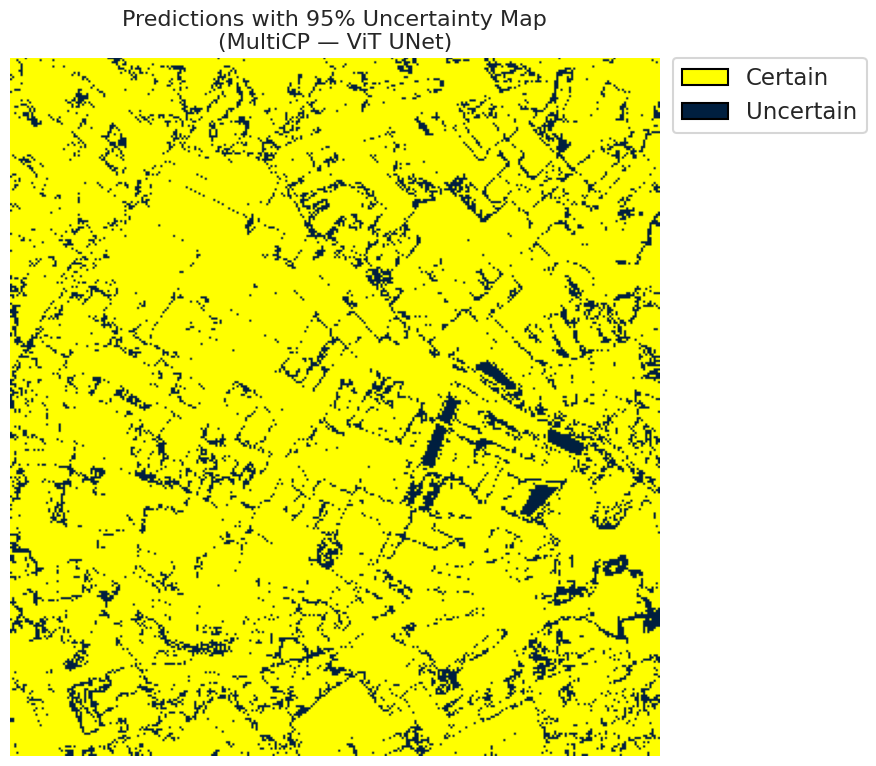

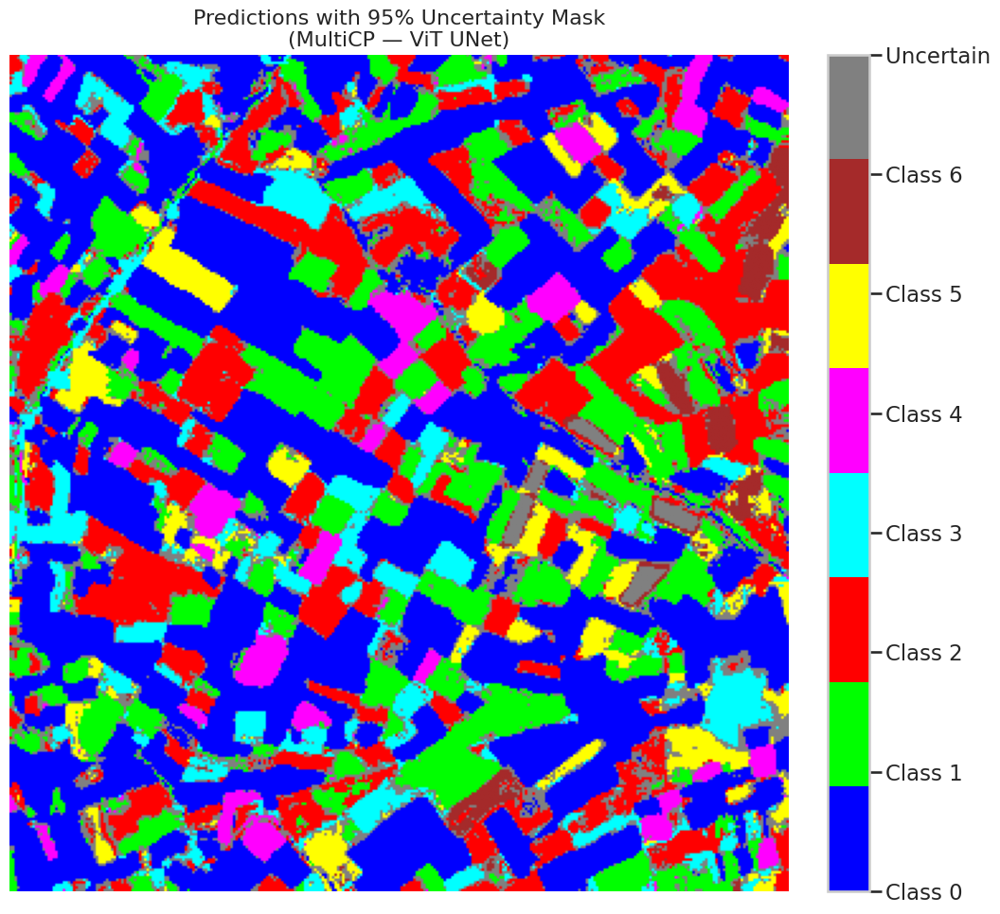

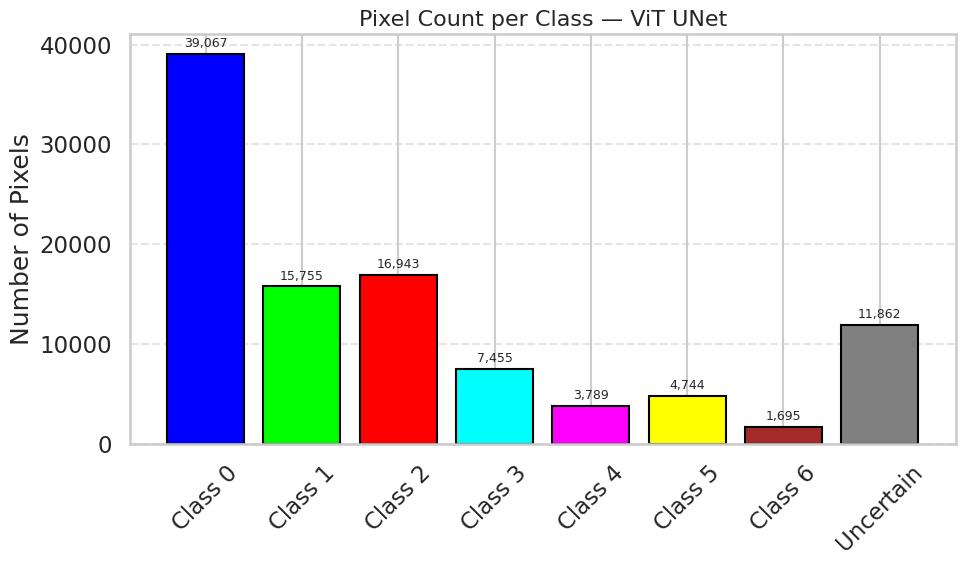

...

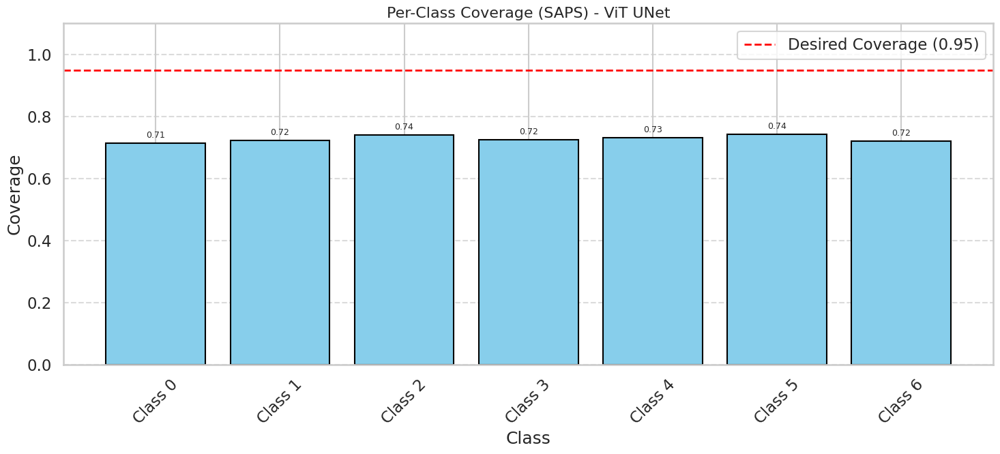

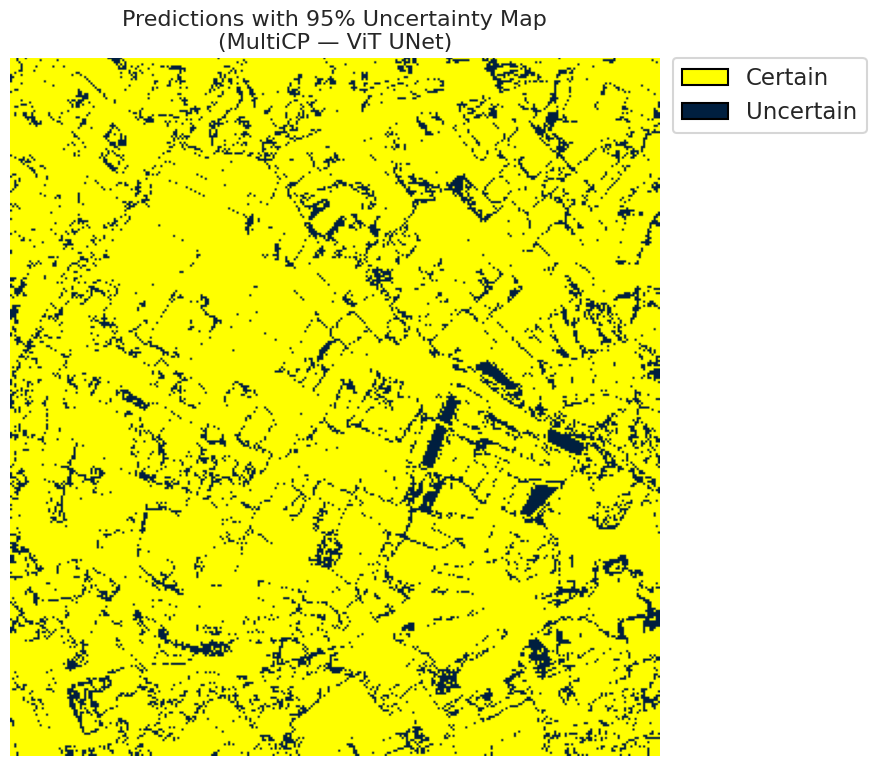

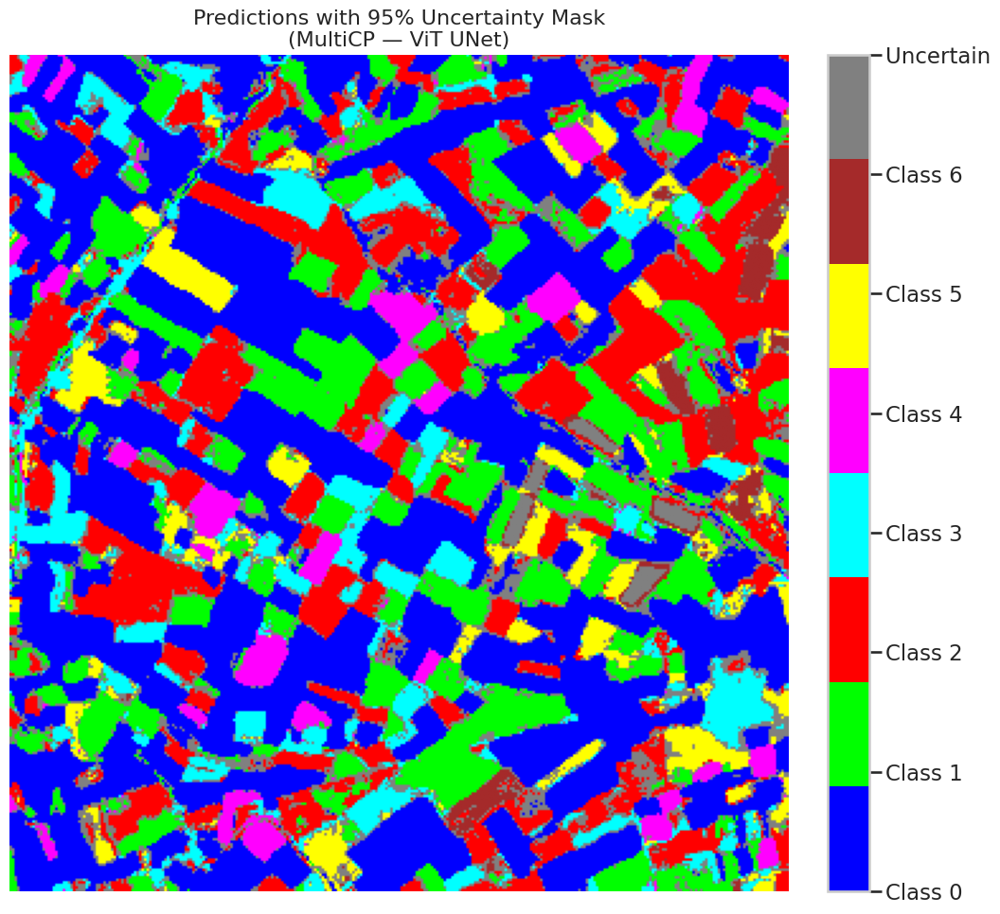

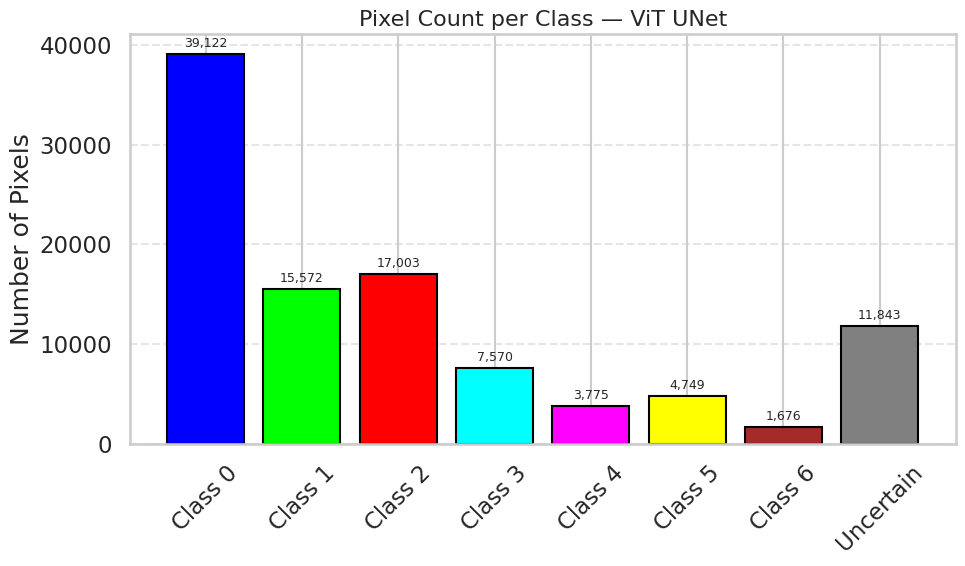

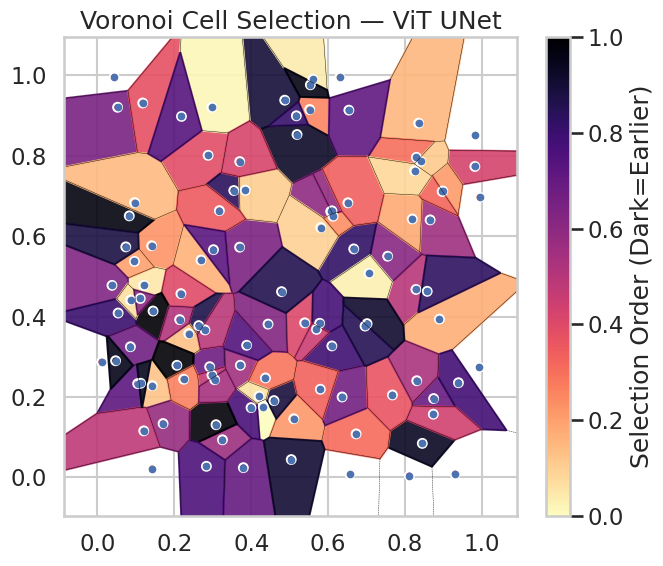

Saved MultiCP workbook to /content/drive/My Drive/Classification/multicp/results/multicp_results.xlsx


,model_key,model_name,scoring_method,empirical_coverage,avg_set_size,scene_coverage,scene_avg_set_size,uncertain_pixel_rate,model_path
0,AlexNet_CNN_MultiHead,AlexNet CNN,RAPS,0.717865,0.959032,0.219214,1.039744,0.116297,/content/drive/My Drive/Classification/multicp...
1,AlexNet_CNN_MultiHead,AlexNet CNN,SAPS,0.727146,0.958900,0.222209,1.021662,0.762955,/content/drive/My Drive/Classification/multicp...
2,GFNet_MultiHead,GFNet,RAPS,0.703016,0.952005,0.223706,1.036679,0.105656,/content/drive/My Drive/Classification/multicp...
3,GFNet_MultiHead,GFNet,SAPS,0.702088,0.951011,0.221370,1.014154,0.726029,/content/drive/My Drive/Classification/multicp...
4,ViT_UNet_MultiHead,ViT UNet,RAPS,0.731787,0.999536,0.241555,1.149140,0.117086,/content/drive/My Drive/Classification/multicp...
5,ViT_UNet_MultiHead,ViT UNet,SAPS,0.723434,0.982168,0.233170,1.082331,0.116899,/content/drive/My Drive/Classification/multicp...


In [16]:
registry = json.loads(MODEL_REGISTRY_PATH.read_text())
wb       = ensure_workbook(WORKBOOK_PATH)

# Clear all sheets except Summary
for sheet in wb.sheetnames[1:]:
    del wb[sheet]

summary_rows = []

for model_key, info in registry.items():
    model_name = MODEL_NAME_MAP.get(model_key, model_key)
    print('\n' + '='*25 + f' Loading {model_name} ' + '='*25)

    model      = load_model(info['best_model_path'], custom_objects=CUSTOM_OBJECTS,
                            compile=False, safe_mode=False)
    cal_output  = get_multihead_outputs(model, x_cal,      BATCH_SIZE)
    test_output = get_multihead_outputs(model, x_test_new, BATCH_SIZE)

    for scoring_method in SCORING_METHODS:
        # ── Conformal evaluation ───────────────────────────────────────────
        head_df, bundle       = compute_head_sweep(
            cal_output, test_output,
            y_cal.astype(np.int32), y_test_new.astype(np.int32),
            scoring_method)
        config, Dc, Dt, Rc, Rt, pred_sets = bundle

        class_cov_df    = per_class_coverage_df(pred_sets, y_test_new.astype(np.int32))
        binary_outputs  = build_binary_uncertainty_outputs(
            model, padded_x, y, config, Dc, Dt, Rc, Rt)

        # ── Figures ────────────────────────────────────────────────────────
        sweep_fig  = head_sweep_figure(head_df, model_name, scoring_method)
        class_fig  = per_class_figure(class_cov_df, model_name, scoring_method)
        binary_fig = binary_uncertainty_figure(binary_outputs['binary_uncertainty_map'], model_name)
        pred_fig   = prediction_map_figure(binary_outputs['display_map'], model_name)
        counts_fig = pixel_count_figure(binary_outputs['class_pixel_counts'], model_name)
        D_i_order  = np.argsort(-np.mean(Dc, axis=1))
        vor_fig, vor_df = visualize_cell_selection(Dc, Dt, D_i_order, model_name)

        # ── Write to Excel ─────────────────────────────────────────────────
        sheet_name = f"{model_key[:10]}_{scoring_method}"[:31]
        ws = wb.create_sheet(title=sheet_name)

        summary = {
            'model_key'          : model_key,
            'model_name'         : model_name,
            'scoring_method'     : scoring_method,
            'empirical_coverage' : float(head_df.iloc[-1]['coverage']),
            'avg_set_size'       : float(head_df.iloc[-1]['set_size']),
            'scene_coverage'     : float(binary_outputs['coverage']),
            'scene_avg_set_size' : float(binary_outputs['mean_set_size']),
            'uncertain_pixel_rate': float(binary_outputs['binary_uncertainty_map'].mean()),
            'model_path'         : info['best_model_path'],
        }
        for idx, (k, v) in enumerate(summary.items(), start=1):
            ws.cell(row=idx, column=1, value=k)
            ws.cell(row=idx, column=2, value=v)

        write_df(ws, head_df,    start_row=12, start_col=1)
        write_df(ws, class_cov_df, start_row=12, start_col=6)
        write_df(ws, pd.DataFrame({
            'Class' : [f'Class {i}' for i in range(NUM_CLASSES)] + ['Uncertain'],
            'Pixels': binary_outputs['class_pixel_counts'],
        }), start_row=12, start_col=10)
        write_df(ws, vor_df, start_row=40, start_col=1)

        for anchor, fig in [('N2',  sweep_fig), ('N28', class_fig),
                             ('N54', binary_fig), ('V54', pred_fig),
                             ('N80', counts_fig), ('V2',  vor_fig)]:
            add_image(ws, fig, anchor)

        autosize_columns(ws)
        summary_rows.append(summary)

# ── Finalise Summary sheet ─────────────────────────────────────────────────
summary_df = pd.DataFrame(summary_rows)
summary_ws = wb['Summary']
summary_ws.delete_rows(1, summary_ws.max_row)
write_df(summary_ws, summary_df)
autosize_columns(summary_ws)
wb.save(WORKBOOK_PATH)

print('Saved MultiCP workbook to', WORKBOOK_PATH)
summary_df

In [17]:
# ── Final status ──────────────────────────────────────────────────────────
print("\n" + "="*60)
print("  ✅  MultiCP evaluation complete")
print(f"  📊  Models evaluated : {len(registry)}")
print(f"  📁  Workbook saved   : {WORKBOOK_PATH}")
print(f"  📋  Sheets written   : {', '.join(wb.sheetnames)}")
print("="*60)
summary_df


  ✅  MultiCP evaluation complete
  📊  Models evaluated : 3
  📁  Workbook saved   : /content/drive/My Drive/Classification/multicp/results/multicp_results.xlsx
  📋  Sheets written   : Summary, AlexNet_CN_RAPS, AlexNet_CN_SAPS, GFNet_Mult_RAPS, GFNet_Mult_SAPS, ViT_UNet_M_RAPS, ViT_UNet_M_SAPS


,model_key,model_name,scoring_method,empirical_coverage,avg_set_size,scene_coverage,scene_avg_set_size,uncertain_pixel_rate,model_path
0,AlexNet_CNN_MultiHead,AlexNet CNN,RAPS,0.717865,0.959032,0.219214,1.039744,0.116297,/content/drive/My Drive/Classification/multicp...
1,AlexNet_CNN_MultiHead,AlexNet CNN,SAPS,0.727146,0.958900,0.222209,1.021662,0.762955,/content/drive/My Drive/Classification/multicp...
2,GFNet_MultiHead,GFNet,RAPS,0.703016,0.952005,0.223706,1.036679,0.105656,/content/drive/My Drive/Classification/multicp...
3,GFNet_MultiHead,GFNet,SAPS,0.702088,0.951011,0.221370,1.014154,0.726029,/content/drive/My Drive/Classification/multicp...
4,ViT_UNet_MultiHead,ViT UNet,RAPS,0.731787,0.999536,0.241555,1.149140,0.117086,/content/drive/My Drive/Classification/multicp...
5,ViT_UNet_MultiHead,ViT UNet,SAPS,0.723434,0.982168,0.233170,1.082331,0.116899,/content/drive/My Drive/Classification/multicp...
